# Evaluating KANs vs MLPs for MNIST Classification in FL

This notebook is based mainly on the Flower Tutorial "Use a federated learning strategy", found in https://flower.ai/docs/framework/tutorial-series-use-a-federated-learning-strategy-pytorch.html .


## Global Values


In [ ]:
NUM_PARTITIONS = 100
BATCH_SIZE = 64
LOCAL_EPOCHS = 5
FRACTION_CLIENTS = 0.1
COMM_ROUNDS = 100
NET_TYPE = "fastkan"
LEARNING_RATE = 0.1
MOMENTUM = 0.9
HISTORY = {}
TRY_DEVICE = "cuda" # 'cuda' for gpu
SEED = 249

## Dependencies


In [ ]:
!pip install -q flwr[simulation] flwr-datasets[vision] torch torchvision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.7/66.7 MB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 kB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 117.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 42.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 21.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 60.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.1/250.1 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.3/47.3 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 703.2/703.2 kB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.0/87.0 kB 8.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is th

In [ ]:
from collections import OrderedDict
from typing import Dict, List, Optional, Tuple

import random
import os
import re
import json
from logging import INFO

from google.colab import drive

import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import DataLoader

import flwr
from flwr.client import Client, ClientApp, NumPyClient
from flwr.server import ServerApp, ServerConfig, ServerAppComponents, SimpleClientManager
from flwr.server.strategy import FedAvg, FedAdagrad
from flwr.simulation import run_simulation, start_simulation
from flwr_datasets import FederatedDataset
from flwr_datasets.partitioner import PathologicalPartitioner, NaturalIdPartitioner
from flwr_datasets.visualization import plot_label_distributions
from flwr.common import ndarrays_to_parameters, NDArrays, Scalar, Context, Metrics
from flwr.common.logger import log
from flwr.server.client_proxy import ClientProxy
from flwr.server.criterion import Criterion
from flwr_datasets.preprocessor import Divider

# from efficient_kan import KAN
# from fastkan import FastKAN

DEVICE = torch.device(TRY_DEVICE)  # "cpu" or "cuda" ("mps" for Apple Silicon)
print(f"Training on {DEVICE}")
print(f"Flower {flwr.__version__} / PyTorch {torch.__version__}")

Training on cuda
Flower 1.22.0 / PyTorch 2.8.0+cu126


##Pure KAN classes


In [ ]:
class PureKANLinear(torch.nn.Module):
    def __init__(
        self,
        in_features,
        out_features,
        grid_size=5,
        spline_order=3,
        scale_noise=0.1,
        scale_spline=1.0,
        enable_standalone_scale_spline=True,
        grid_eps=0.02,
        grid_range=[-1, 1],
    ):
        super(PureKANLinear, self).__init__()
        self.in_features = in_features
        self.out_features = out_features
        self.grid_size = grid_size
        self.spline_order = spline_order

        # construct the grid
        h = (grid_range[1] - grid_range[0]) / grid_size
        grid = (
            (
                torch.arange(-spline_order, grid_size + spline_order + 1) * h
                + grid_range[0]
            )
            .expand(in_features, -1)
            .contiguous()
        )
        self.register_buffer("grid", grid)

        # spline weights
        self.spline_weight = torch.nn.Parameter(
            torch.Tensor(out_features, in_features, grid_size + spline_order)
        )
        if enable_standalone_scale_spline:
            self.spline_scaler = torch.nn.Parameter(
                torch.Tensor(out_features, in_features)
            )

        self.scale_noise = scale_noise
        self.scale_spline = scale_spline
        self.enable_standalone_scale_spline = enable_standalone_scale_spline
        self.grid_eps = grid_eps

        self.reset_parameters()

    def reset_parameters(self):
        with torch.no_grad():
            noise = (
                (
                    torch.rand(self.grid_size + 1, self.in_features, self.out_features)
                    - 0.5
                )
                * self.scale_noise
                / self.grid_size
            )
            self.spline_weight.data.copy_(
                (self.scale_spline if not self.enable_standalone_scale_spline else 1.0)
                * self.curve2coeff(
                    self.grid.T[self.spline_order : -self.spline_order],
                    noise,
                )
            )
            if self.enable_standalone_scale_spline:
                torch.nn.init.constant_(self.spline_scaler, self.scale_spline)

    def b_splines(self, x: torch.Tensor):
        assert x.dim() == 2 and x.size(1) == self.in_features

        grid: torch.Tensor = self.grid
        x = x.unsqueeze(-1)
        bases = ((x >= grid[:, :-1]) & (x < grid[:, 1:])).to(x.dtype)
        for k in range(1, self.spline_order + 1):
            bases = (
                (x - grid[:, : -(k + 1)])
                / (grid[:, k:-1] - grid[:, : -(k + 1)])
                * bases[:, :, :-1]
            ) + (
                (grid[:, k + 1 :] - x)
                / (grid[:, k + 1 :] - grid[:, 1:(-k)])
                * bases[:, :, 1:]
            )

        return bases.contiguous()

    def curve2coeff(self, x: torch.Tensor, y: torch.Tensor):
        assert x.dim() == 2 and x.size(1) == self.in_features
        assert y.size() == (x.size(0), self.in_features, self.out_features)

        A = self.b_splines(x).transpose(0, 1)
        B = y.transpose(0, 1)
        solution = torch.linalg.lstsq(A, B).solution
        result = solution.permute(2, 0, 1)
        return result.contiguous()

    @property
    def scaled_spline_weight(self):
        return self.spline_weight * (
            self.spline_scaler.unsqueeze(-1)
            if self.enable_standalone_scale_spline
            else 1.0
        )

    def forward(self, x: torch.Tensor):
        assert x.size(-1) == self.in_features
        original_shape = x.shape
        x = x.reshape(-1, self.in_features)

        # PURE spline output (no base/linear part)
        spline_output = F.linear(
            self.b_splines(x).view(x.size(0), -1),
            self.scaled_spline_weight.view(self.out_features, -1),
        )

        output = spline_output.reshape(*original_shape[:-1], self.out_features)
        return output


class PureKAN(torch.nn.Module):
    def __init__(
        self,
        layers_hidden,
        grid_size=5,
        spline_order=3,
        scale_noise=0.1,
        scale_spline=1.0,
        grid_eps=0.02,
        grid_range=[-1, 1],
    ):
        super(PureKAN, self).__init__()

        self.layers = torch.nn.ModuleList()
        for in_features, out_features in zip(layers_hidden, layers_hidden[1:]):
            self.layers.append(
                PureKANLinear(
                    in_features,
                    out_features,
                    grid_size=grid_size,
                    spline_order=spline_order,
                    scale_noise=scale_noise,
                    scale_spline=scale_spline,
                    grid_eps=grid_eps,
                    grid_range=grid_range,
                )
            )

    def forward(self, x: torch.Tensor):
        for layer in self.layers:
            x = layer(x)
        return x


##RBF KAN Classes


In [ ]:
# Copyright 2024 Li, Ziyao
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.


import torch
import torch.nn as nn
import torch.nn.functional as F
import math
from typing import *

class SplineLinear(nn.Linear):
    def __init__(self, in_features: int, out_features: int, init_scale: float = 0.1, **kw) -> None:
        self.init_scale = init_scale
        super().__init__(in_features, out_features, bias=False, **kw)

    def reset_parameters(self) -> None:
        nn.init.trunc_normal_(self.weight, mean=0, std=self.init_scale)

class RadialBasisFunction(nn.Module):
    def __init__(
        self,
        grid_min: float = -2.,
        grid_max: float = 2.,
        num_grids: int = 8,
        denominator: float = None,  # larger denominators lead to smoother basis
    ):
        super().__init__()
        self.grid_min = grid_min
        self.grid_max = grid_max
        self.num_grids = num_grids
        grid = torch.linspace(grid_min, grid_max, num_grids)
        self.grid = torch.nn.Parameter(grid, requires_grad=False)
        self.denominator = denominator or (grid_max - grid_min) / (num_grids - 1)

    def forward(self, x):
        return torch.exp(-((x[..., None] - self.grid) / self.denominator) ** 2)

class FastKANLayer(nn.Module):
    def __init__(
        self,
        input_dim: int,
        output_dim: int,
        grid_min: float = -2.,
        grid_max: float = 2.,
        num_grids: int = 8,
        use_base_update: bool = False,
        use_layernorm: bool = True,
        base_activation = F.silu,
        spline_weight_init_scale: float = 0.1,
    ) -> None:
        super().__init__()
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.layernorm = None
        if use_layernorm:
            assert input_dim > 1, "Do not use layernorms on 1D inputs. Set `use_layernorm=False`."
            self.layernorm = nn.LayerNorm(input_dim)
        self.rbf = RadialBasisFunction(grid_min, grid_max, num_grids)
        self.spline_linear = SplineLinear(input_dim * num_grids, output_dim, spline_weight_init_scale)
        self.use_base_update = use_base_update
        if use_base_update:
            self.base_activation = base_activation
            self.base_linear = nn.Linear(input_dim, output_dim)

    def forward(self, x, use_layernorm=True):
        if self.layernorm is not None and use_layernorm:
            spline_basis = self.rbf(self.layernorm(x))
        else:
            spline_basis = self.rbf(x)
        ret = self.spline_linear(spline_basis.view(*spline_basis.shape[:-2], -1))
        if self.use_base_update:
            base = self.base_linear(self.base_activation(x))
            ret = ret + base
        return ret

    def plot_curve(
        self,
        input_index: int,
        output_index: int,
        num_pts: int = 1000,
        num_extrapolate_bins: int = 2
    ):
        '''this function returns the learned curves in a FastKANLayer.
        input_index: the selected index of the input, in [0, input_dim) .
        output_index: the selected index of the output, in [0, output_dim) .
        num_pts: num of points sampled for the curve.
        num_extrapolate_bins (N_e): num of bins extrapolating from the given grids. The curve
            will be calculate in the range of [grid_min - h * N_e, grid_max + h * N_e].
        '''
        ng = self.rbf.num_grids
        h = self.rbf.denominator
        assert input_index < self.input_dim
        assert output_index < self.output_dim
        w = self.spline_linear.weight[
            output_index, input_index * ng : (input_index + 1) * ng
        ]   # num_grids,
        x = torch.linspace(
            self.rbf.grid_min - num_extrapolate_bins * h,
            self.rbf.grid_max + num_extrapolate_bins * h,
            num_pts
        )   # num_pts, num_grids
        with torch.no_grad():
            y = (w * self.rbf(x.to(w.dtype))).sum(-1)
        return x, y


class FastKAN(nn.Module):
    def __init__(
        self,
        layers_hidden: List[int],
        grid_min: float = -2.,
        grid_max: float = 2.,
        num_grids: int = 8,
        use_base_update: bool = True,
        base_activation = F.silu,
        spline_weight_init_scale: float = 0.1,
    ) -> None:
        super().__init__()
        self.layers = nn.ModuleList([
            FastKANLayer(
                in_dim, out_dim,
                grid_min=grid_min,
                grid_max=grid_max,
                num_grids=num_grids,
                use_base_update=use_base_update,
                base_activation=base_activation,
                spline_weight_init_scale=spline_weight_init_scale,
            ) for in_dim, out_dim in zip(layers_hidden[:-1], layers_hidden[1:])
        ])

    def forward(self, x):
        for layer in self.layers:
            x = layer(x)
        return x


class AttentionWithFastKANTransform(nn.Module):

    def __init__(
        self,
        q_dim: int,
        k_dim: int,
        v_dim: int,
        head_dim: int,
        num_heads: int,
        gating: bool = True,
    ):
        super(AttentionWithFastKANTransform, self).__init__()

        self.num_heads = num_heads
        total_dim = head_dim * self.num_heads
        self.gating = gating
        self.linear_q = FastKANLayer(q_dim, total_dim)
        self.linear_k = FastKANLayer(k_dim, total_dim)
        self.linear_v = FastKANLayer(v_dim, total_dim)
        self.linear_o = FastKANLayer(total_dim, q_dim)
        self.linear_g = None
        if self.gating:
            self.linear_g = FastKANLayer(q_dim, total_dim)
        # precompute the 1/sqrt(head_dim)
        self.norm = head_dim**-0.5

    def forward(
        self,
        q: torch.Tensor,
        k: torch.Tensor,
        v: torch.Tensor,
        bias: torch.Tensor = None,      # additive attention bias
    ) -> torch.Tensor:

        wq = self.linear_q(q).view(*q.shape[:-1], 1, self.num_heads, -1) * self.norm     # *q1hc
        wk = self.linear_k(k).view(*k.shape[:-2], 1, k.shape[-2], self.num_heads, -1)    # *1khc
        att = (wq * wk).sum(-1).softmax(-2)     # *qkh
        del wq, wk
        if bias is not None:
            att = att + bias[..., None]

        wv = self.linear_v(v).view(*v.shape[:-2],1, v.shape[-2], self.num_heads, -1)     # *1khc
        o = (att[..., None] * wv).sum(-3)        # *qhc
        del att, wv

        o = o.view(*o.shape[:-2], -1)           # *q(hc)

        if self.linear_g is not None:
            # gating, use raw query input
            g = self.linear_g(q)
            o = torch.sigmoid(g) * o

        # merge heads
        o = self.linear_o(o)
        return o


## Mount Google Drive


In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


## Configuring Seeds


In [ ]:
torch.manual_seed(SEED)
random.seed(SEED)
np.random.seed(SEED)
os.environ["PYTHONHASHSEED"] = str(SEED)
# torch.use_deterministic_algorithms(True)
# torch.backends.cudnn.benchmark = False
# torch.backends.cudnn.deterministic = True

## Kaggle Dataset Loading


In [ ]:
from google.colab import files
files.upload()  # Upload the `kaggle.json` file here

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"chirantha210613u","key":"4d00eab596a2e3cd94dc70515d0fe15a"}'}

In [ ]:
import os
import zipfile

# Make a directory and move kaggle.json there
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/

# Set permissions
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!pip install -q kaggle

In [ ]:
# Replace this with the actual dataset name
!kaggle datasets download -d danialsharifrazi/cad-cardiac-mri-dataset

Dataset URL: https://www.kaggle.com/datasets/danialsharifrazi/cad-cardiac-mri-dataset
License(s): unknown
 99% 2.84G/2.86G [00:25<00:00, 250MB/s]
100% 2.86G/2.86G [00:25<00:00, 121MB/s]


In [ ]:
!unzip cad-cardiac-mri-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Sick/Directory_26/SR_57/IM00059.jpg  
  inflating: Sick/Directory_26/SR_57/IM00060.jpg  
  inflating: Sick/Directory_26/SR_58/IM00001.jpg  
  inflating: Sick/Directory_26/SR_58/IM00002.jpg  
  inflating: Sick/Directory_26/SR_58/IM00003.jpg  
  inflating: Sick/Directory_26/SR_58/IM00004.jpg  
  inflating: Sick/Directory_26/SR_58/IM00005.jpg  
  inflating: Sick/Directory_26/SR_58/IM00006.jpg  
  inflating: Sick/Directory_26/SR_58/IM00007.jpg  
  inflating: Sick/Directory_26/SR_58/IM00008.jpg  
  inflating: Sick/Directory_26/SR_58/IM00009.jpg  
  inflating: Sick/Directory_26/SR_58/IM00010.jpg  
  inflating: Sick/Directory_26/SR_58/IM00011.jpg  
  inflating: Sick/Directory_26/SR_58/IM00012.jpg  
  inflating: Sick/Directory_26/SR_58/IM00013.jpg  
  inflating: Sick/Directory_26/SR_59/IM00001.jpg  
  inflating: Sick/Directory_26/SR_59/IM00002.jpg  
  inflating: Sick/Directory_26/SR_59/IM00003.jpg  
  inflating: Sick/Directory_26/

In [ ]:
import os
from glob import glob

# Assuming you're in the Colab default directory after unzipping
base_path = '/content/Sick'  # This is the default directory in Colab

# Recursively search for all .jpg images
image_paths = glob(os.path.join(base_path, '**', '*.jpg'), recursive=True)

# Optional: sort the image list
image_paths.sort()

In [ ]:
# Root directories
normal_root = '/content/Normal'
sick_root = '/content/Sick'

# Get all .jpg files recursively
normal_images = glob(os.path.join(normal_root, '**', '*.jpg'), recursive=True)
sick_images = glob(os.path.join(sick_root, '**', '*.jpg'), recursive=True)

# Combine and label
all_images = normal_images + sick_images
labels = [0] * len(normal_images) + [1] * len(sick_images)

print(f'Total Normal images: {len(normal_images)}')
print(f'Total Sick images: {len(sick_images)}')

Total Normal images: 37564
Total Sick images: 25861


## Data loading


In [ ]:
import os
from glob import glob
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split

In [ ]:
from torch.utils.data import Subset

def partition_dataset(image_paths, labels, num_partitions):
    partitions = [[] for _ in range(num_partitions)]
    label_partitions = [[] for _ in range(num_partitions)]

    for i, (path, label) in enumerate(zip(image_paths, labels)):
        partitions[i % num_partitions].append(path)
        label_partitions[i % num_partitions].append(label)

    return list(zip(partitions, label_partitions))


In [ ]:
class MRIDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]

        image = Image.open(img_path).convert('L')  # Use 'RGB' if your images are in color

        if self.transform:
            image = self.transform(image)

        return {"image": image, "label": label}

In [ ]:
def load_datasets(partition_id: int, num_partitions: int = 5):
    transform = transforms.Compose([
        transforms.Resize((32, 32)),
        transforms.ToTensor(),
        transforms.Normalize((0.5,), (0.5,))
    ])

    partitioned_data = partition_dataset(all_images, labels, num_partitions)

    image_paths_partition, labels_partition = partitioned_data[partition_id]

    train_paths, val_paths, train_labels, val_labels = train_test_split(
        image_paths_partition, labels_partition, test_size=0.2, stratify=labels_partition, random_state=42
    )

    train_dataset = MRIDataset(train_paths, train_labels, transform=transform)
    val_dataset = MRIDataset(val_paths, val_labels, transform=transform)

    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

    return train_loader, val_loader


### Partition Visualization


In [ ]:
import pandas as pd
from collections import Counter

def get_partition_df(image_paths, labels, num_partitions):
    partitions = [[] for _ in range(num_partitions)]
    label_partitions = [[] for _ in range(num_partitions)]

    for i, (path, label) in enumerate(zip(image_paths, labels)):
        partitions[i % num_partitions].append(path)
        label_partitions[i % num_partitions].append(label)

    data = []
    for pid, labels in enumerate(label_partitions):
        label_counts = Counter(labels)
        for label, count in label_counts.items():
            data.append({"partition_id": pid, "label": label, "count": count})

    return pd.DataFrame(data)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_label_distribution(df, title="Label Distribution per Partition"):
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df, x="partition_id", y="count", hue="label")
    plt.title(title)
    plt.xlabel("Partition ID")
    plt.ylabel("Number of Samples")
    plt.grid(True)
    plt.legend(title="Label")
    plt.tight_layout()
    plt.show()


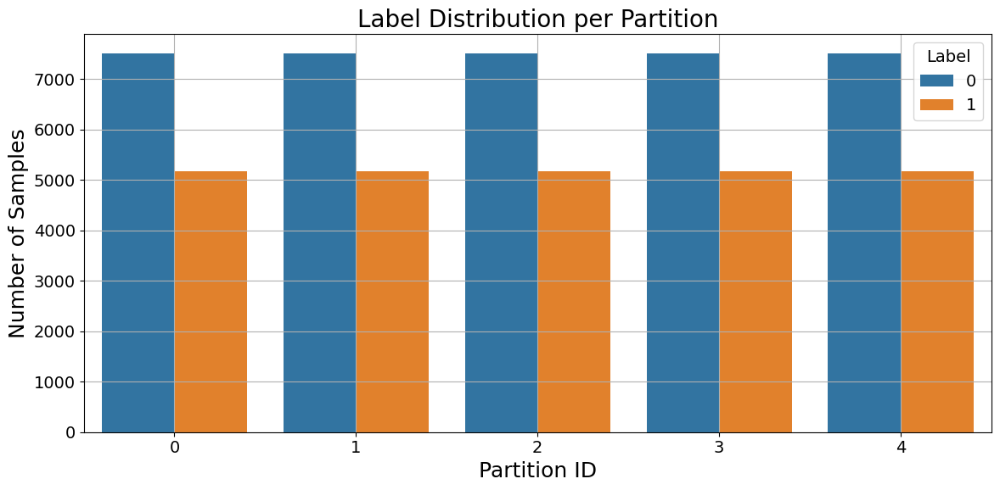

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
partition_df = get_partition_df(all_images, labels, num_partitions=5)
plot_label_distribution(partition_df)


In [ ]:
partition_df

,partition_id,label,count
0,0,0,7513
1,0,1,5172
2,1,0,7513
3,1,1,5172
4,2,0,7513
5,2,1,5172
6,3,0,7513
7,3,1,5172
8,4,0,7512
9,4,1,5173


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


### Statistics for Number of Examples per Partition


In [ ]:
partition_df.sum(1).describe()

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,0
count,10.000000
mean,6345.000000
std,1233.078442
min,5173.000000
25%,5175.250000
50%,6345.500000
75%,7514.750000
max,7516.000000


### Calculate Mean Number of Updates Per Round


In [ ]:
(partition_df.sum(1) / BATCH_SIZE).apply(np.ceil)

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


,0
0,118.0
1,81.0
2,118.0
3,81.0
4,118.0
5,81.0
6,118.0
7,81.0
8,118.0
9,81.0


## Model training/evaluation (PyTorch)


In [ ]:
class MLPNet(nn.Module):
    def __init__(self) -> None:
        super(MLPNet, self).__init__()
        # self.conv_layers = nn.Sequential(
        #     nn.Conv2d(1, 16, kernel_size=3, padding=1),   # 1 input channel (grayscale), 16 output
        #     nn.ReLU(),
        #     nn.MaxPool2d(2, 2),  # 64x64

        #     nn.Conv2d(16, 32, kernel_size=3, padding=1),
        #     nn.ReLU(),
        #     nn.MaxPool2d(2, 2),  # 32x32
        # )
        self.fc_layers = nn.Sequential(
            nn.Linear(32*32 , 128),
            nn.ReLU(),
            nn.Dropout(0.3),

            nn.Linear(128, 64),
            nn.ReLU(),

            nn.Linear(64, 1),   # Binary classification: output logit
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.relu(self.layer1(x))
        x = self.relu(self.layer2(x))
        x = self.softmax(self.layer3(x))
        return x

class KANNet(PureKAN):
    def __init__(self) -> None:
        super().__init__([32*32 , 24, 24, 1])

    def forward(self, x):
        # Flatten the input for KAN
        x = x.view(x.size(0), -1)
        return super().forward(x)

class FastKANNet(FastKAN):
    def __init__(self) -> None:
        super().__init__([32*32, 24, 24, 1])

    def forward(self, x):
        # Flatten the input for KAN
        x = x.view(x.size(0), -1)
        return super().forward(x)

def create_network(net_type: str):
    if net_type == "mlp":
        return MLPNet()
    elif net_type == "kan":
        return KANNet()
    elif net_type == "fastkan":
        return FastKANNet()
    else:
        raise ValueError(f"Unknown network type: {net_type}")

def get_parameters(net) -> List[np.ndarray]:
    return [val.cpu().numpy() for _, val in net.state_dict().items()]


def set_parameters(net, parameters: List[np.ndarray]):
    params_dict = zip(net.state_dict().keys(), parameters)
    state_dict = OrderedDict({k: torch.Tensor(v) for k, v in params_dict})
    net.load_state_dict(state_dict, strict=True)

def get_model_size_in_MB(parameters):
    total_bytes = 0
    for param in parameters:
        total_bytes += param.size * param.itemsize  # num elements * bytes per element
    return total_bytes / (1024 * 1024)  # Convert to MB


def train(net, trainloader, epochs: int):
    """Train the network on the training set."""
    criterion = torch.nn.BCEWithLogitsLoss()
    optimizer = torch.optim.SGD(
        net.parameters(),
        lr=LEARNING_RATE,
        momentum=MOMENTUM)
    net.train()
    for epoch in range(epochs):
        correct, total, epoch_loss = 0, 0, 0.0
        for batch in trainloader:
            images, labels = batch["image"], batch["label"]
            images, labels = images.to(DEVICE), labels.to(DEVICE).float().unsqueeze(1)
            optimizer.zero_grad()
            outputs = net(images)
            loss = criterion(net(images), labels)
            loss.backward()
            optimizer.step()
            # Metrics
            epoch_loss += loss
            total += labels.size(0)
            predicted = (torch.sigmoid(outputs) > 0.5).float()
            correct += (predicted == labels).sum().item()
        epoch_loss /= len(trainloader.dataset)
        epoch_acc = correct / total
        print(f"Epoch {epoch+1}: train loss {epoch_loss}, accuracy {epoch_acc}")
        return epoch_loss, epoch_acc


def test(net, testloader):
    """Evaluate the network on the entire test set."""
    criterion = torch.nn.BCEWithLogitsLoss()
    correct, total, loss = 0, 0, 0.0
    net.eval()
    with torch.no_grad():
        for batch in testloader:
            images, labels = batch["image"], batch["label"]
            images, labels = images.to(DEVICE), labels.to(DEVICE).float().unsqueeze(1)
            outputs = net(images)
            loss += criterion(outputs, labels).item()
            predicted = (torch.sigmoid(outputs) > 0.5).float()
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    loss /= len(testloader.dataset)
    accuracy = correct / total
    return loss, accuracy

## Flower Architecture


### Flower client


In [ ]:
THRESHOLD = 0.005  # Divergence threshold: lower means more communication
BETA = 0.1         # Trust sensitivity: higher means more penalty for divergence
WARMUP = 5         # Rounds to wait before activating Trust logic

class FlowerClient(NumPyClient):
    def __init__(self, pid, net, trainloader, valloader=None):
        self.pid = pid  # partition ID of a client
        self.net = net
        self.trainloader = trainloader
        self.valloader = valloader

    def get_parameters(self, config):
        print(f"[Client {self.pid}] get_parameters")
        return get_parameters(self.net)

    def fit(self, parameters, config):
        # 1. Get instructions from server config
        server_round = config["server_round"]
        local_epochs = config["local_epochs"]

        # 2. Store original parameters to calculate divergence later
        original_parameters = parameters

        # 3. Train the model locally
        set_parameters(self.net, parameters)
        epoch_loss, epoch_accuracy = train(self.net, self.trainloader, epochs=local_epochs)

        # 4. Get the new trained weights
        new_parameters = get_parameters(self.net)

        # 5. COMMUNICATION EFFICIENCY LOGIC
        # Calculate how much the spline weights moved (Euclidean distance)
        changes = [np.linalg.norm(np.array(nw) - np.array(ow))
                   for nw, ow in zip(new_parameters, original_parameters)]
        local_divergence = np.mean(changes)

        # Research Threshold: If the change is too small, we don't upload
        # This saves communication overhead as per your supervisor's suggestion

        if local_divergence < THRESHOLD:
            print(f"[Client {self.pid}] Round {server_round}: Divergence {local_divergence:.5f} < Threshold. Skip Upload.")
            return original_parameters, len(self.trainloader), {"skipped": True}

        # 6. Return weights and the divergence score to help the server calculate trust
        print(f"[Client {self.pid}] Round {server_round}: Uploading update (Div: {local_divergence:.5f})")
        return new_parameters, len(self.trainloader), {
            "epoch_loss": float(epoch_loss),
            "epoch_accuracy": float(epoch_accuracy),
            "skipped": False,
            "divergence": float(local_divergence)
        }

    def evaluate(self, parameters, config):
        print(f"[Client {self.pid}] evaluate, config: {config}")
        set_parameters(self.net, parameters)
        loss, accuracy = test(self.net, self.valloader)
        return float(loss), len(self.valloader), {"accuracy": float(accuracy)}


def client_fn(context: Context) -> Client:
    net = create_network(NET_TYPE).to(DEVICE)
    partition_id = context.node_config["partition-id"]
    num_partitions = context.node_config["num-partitions"]
    trainloader, _ = load_datasets(partition_id, num_partitions)
    return FlowerClient(partition_id, net, trainloader).to_client()

### Server-side parameter **evaluation**


#### Save evaluation results


In [ ]:
def create_new_history():
    history = {"net_type": NET_TYPE,
              "test_accuracy": [],
              "test_loss": [],
              "train_accuracy": [0.0], # No fit metrics before the first round
              "train_loss": [0.0],
              "execution_time": 0,
              "seed": SEED,
              "batch_size": BATCH_SIZE,
              "local_epochs": LOCAL_EPOCHS,
              "fraction_clients": FRACTION_CLIENTS,
              "comm_rounds": COMM_ROUNDS,
              "num_partitions": NUM_PARTITIONS,
              "device": str(DEVICE),
              "learning_rate": LEARNING_RATE,
              "momentum": MOMENTUM,
              "Communication_sizes": [],
              }
    return history

# Need to use a global var because we can't pass our dictionary as argument
def save_test_metrics(server_round: int, accuracy: float, loss: float, model_size: float):
    HISTORY["test_accuracy"].append((accuracy, server_round))
    HISTORY["test_loss"].append((loss, server_round))
    HISTORY["Communication_sizes"].append((model_size, server_round))

# Currently can't capture the server round inside the fit aggregation function
def save_train_metrics(accuracy: float, loss: float):
    HISTORY["train_accuracy"].append(accuracy)
    HISTORY["train_loss"].append(loss)

def save_execution_time(execution_time: float):
    HISTORY["execution_time"] = execution_time

#### Evaluation function


In [ ]:
# The `evaluate` function will be called by Flower after every round
def evaluate(
    server_round: int,
    parameters: NDArrays,
    config: Dict[str, Scalar],
) -> Optional[Tuple[float, Dict[str, Scalar]]]:
    net = create_network(NET_TYPE).to(DEVICE)
    _, testloader = load_datasets(0, NUM_PARTITIONS)
    model_size = get_model_size_in_MB(parameters)
    set_parameters(net, parameters)  # Update model with the latest parameters
    loss, accuracy = test(net, testloader)
    print(f"Server-side evaluation loss {loss} / accuracy {accuracy} / Communication cost {model_size}")
    save_test_metrics(server_round, accuracy, loss, model_size)
    return loss, {"accuracy": accuracy}

### Training **Configuration** (e.g. epochs)


In [ ]:
def fit_config(server_round: int):
    """Return training configuration dict for each round.

    """
    config = {
        "server_round": server_round,  # The current round of federated learning
        "local_epochs": LOCAL_EPOCHS,
    }
    return config

### Flower **Server**


#### Fit (training) Metrics Aggregation


In [ ]:
def weighted_average(metrics: List[Tuple[int, Metrics]]) -> Metrics:
    """Inspired by https://github.com/adap/flower/blob/0e7c1b06c32ab90e0d3cf64825ed51eedd715509/examples/custom-mods/server.py"""

    # Get number of examples for each client used for training
    examples = [num_examples for num_examples, _ in metrics]

    # Multiply accuracy of each client by number of examples used
    train_losses = [
        num_examples * float(m["epoch_loss"]) for num_examples, m in metrics
    ]
    train_accuracies = [
        num_examples * float(m["epoch_accuracy"]) for num_examples, m in metrics
    ]

    train_loss = sum(train_losses) / sum(examples)
    train_accuracy = sum(train_accuracies) / sum(examples)

    save_train_metrics(train_accuracy, train_loss)

    # Aggregate and return custom metric (weighted average)
    return {
        "train_loss": sum(train_losses) / sum(examples),
        "train_accuracy": sum(train_accuracies) / sum(examples),
    }

#### Custom Aggregate Helpers

In [ ]:
import numpy as np
from typing import List


def l2_distance(weights_a: List[np.ndarray], weights_b: List[np.ndarray]) -> float:
    """Compute L2 distance between two model parameter sets."""
    return sum(np.linalg.norm(a - b) for a, b in zip(weights_a, weights_b))


def pairwise_distances(weights_list: List[List[np.ndarray]]) -> np.ndarray:
    """Compute pairwise distance matrix."""
    n = len(weights_list)
    distances = np.zeros((n, n))

    for i in range(n):
        for j in range(i + 1, n):
            d = l2_distance(weights_list[i], weights_list[j])
            distances[i, j] = d
            distances[j, i] = d

    return distances


def krum_selection(
    weights_list: List[List[np.ndarray]],
    num_malicious: int,
    m: int
) -> List[int]:
    """
    Multi-Krum selection.
    Returns indices of selected client updates.
    """
    n = len(weights_list)
    distances = pairwise_distances(weights_list)

    scores = []
    for i in range(n):
        sorted_distances = np.sort(distances[i])
        score = np.sum(sorted_distances[: n - num_malicious - 2])
        scores.append((i, score))

    scores.sort(key=lambda x: x[1])
    selected_indices = [idx for idx, _ in scores[:m]]

    return selected_indices


#### Custom Aggregate Strategy


In [ ]:
from flwr.server.strategy import FedAvg
from flwr.common import parameters_to_ndarrays, ndarrays_to_parameters
import numpy as np

class EfficientSplineStrategy(FedAvg):
    def __init__(self, beta=0.1, warmup_rounds=5, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.beta = beta
        self.warmup_rounds = warmup_rounds
        self.current_global_weights = None

    def aggregate_fit(self, server_round, results, failures):
        # 1. Handle Communication Efficiency: Filter out clients that skipped uploading
        active_results = [
            res for res in results if not res[1].metrics.get("skipped", False)
        ]

        if not active_results:
            print(f"Round {server_round}: No significant updates received. Skipping aggregation.")
            return None, {}

        # 2. First Round/Warmup: Use standard averaging (FedAvg)
        if self.current_global_weights is None or server_round <= self.warmup_rounds:
            agg_params, metrics = super().aggregate_fit(server_round, active_results, failures)
            if agg_params:
                self.current_global_weights = parameters_to_ndarrays(agg_params)
            return agg_params, metrics

        # 3. Dynamic Averaging Logic (Spline Divergence)
        weights_results = [
            (parameters_to_ndarrays(fit_res.parameters), fit_res.num_examples)
            for _, fit_res in active_results
        ]

        divergence_scores = []
        for client_weights, _ in weights_results:
            # Measure how far the local spline weights moved from global consensus
            layer_dist = [np.linalg.norm(cw - gw) for cw, gw in zip(client_weights, self.current_global_weights)]
            # Formula: Trust Score = exp(-beta * divergence)
            score = np.exp(-self.beta * np.mean(layer_dist))
            divergence_scores.append(score)

        # 4. Weighted Aggregation based on Trust
        total_score = sum(divergence_scores)
        norm_scores = [s / total_score for s in divergence_scores]

        new_weights = [np.zeros_like(gw) for gw in self.current_global_weights]
        for i, (client_weights, _) in enumerate(weights_results):
            for j in range(len(new_weights)):
                new_weights[j] += client_weights[j] * norm_scores[i]

        self.current_global_weights = new_weights

        # Aggregate metrics (accuracy/loss)
        metrics_agg = self.fit_metrics_aggregation_fn(
            [(res.num_examples, res.metrics) for _, res in active_results]
        ) if self.fit_metrics_aggregation_fn else {}

        return ndarrays_to_parameters(new_weights), metrics_agg

In [ ]:
from flwr.server.strategy import FedAvg
from flwr.common import parameters_to_ndarrays, ndarrays_to_parameters
import numpy as np

from src.utils.aggregation_utils import krum_selection


class KrumSplineStrategy(FedAvg):
    def __init__(
        self,
        beta: float = 0.1,
        warmup_rounds: int = 5,
        num_malicious: int = 1,
        krum_m: int = 3,
        *args,
        **kwargs
    ):
        super().__init__(*args, **kwargs)
        self.beta = beta
        self.warmup_rounds = warmup_rounds
        self.num_malicious = num_malicious
        self.krum_m = krum_m
        self.current_global_weights = None

    def configure_fit(self, server_round, parameters, client_manager):
        """Inject server_round into client config."""
        fit_ins = super().configure_fit(server_round, parameters, client_manager)

        updated = []
        for client, ins in fit_ins:
            ins.config["server_round"] = server_round
            updated.append((client, ins))

        return updated

    def aggregate_fit(self, server_round, results, failures):
        # Remove skipped clients
        active_results = [
            res for res in results if not res[1].metrics.get("skipped", False)
        ]

        if not active_results:
            print(f"[Round {server_round}] No valid client updates.")
            return None, {}

        # Warmup → FedAvg
        if self.current_global_weights is None or server_round <= self.warmup_rounds:
            agg_params, metrics = super().aggregate_fit(
                server_round, active_results, failures
            )
            if agg_params is not None:
                self.current_global_weights = parameters_to_ndarrays(agg_params)
            return agg_params, metrics

        # Convert client parameters
        client_weights = [
            parameters_to_ndarrays(res.parameters) for _, res in active_results
        ]

        # Step 1: Multi-Krum selection
        selected_indices = krum_selection(
            client_weights,
            num_malicious=self.num_malicious,
            m=min(self.krum_m, len(client_weights)),
        )

        selected_weights = [client_weights[i] for i in selected_indices]

        # Step 2: Spline divergence trust scoring
        trust_scores = []
        for cw in selected_weights:
            divergence = np.mean([
                np.linalg.norm(cw_l - gw_l)
                for cw_l, gw_l in zip(cw, self.current_global_weights)
            ])
            trust = np.exp(-self.beta * divergence)
            trust_scores.append(trust)

        trust_scores = np.array(trust_scores)
        trust_scores /= np.sum(trust_scores)

        # Step 3: Weighted aggregation
        new_weights = [
            np.zeros_like(layer) for layer in self.current_global_weights
        ]

        for weight, score in zip(selected_weights, trust_scores):
            for i in range(len(new_weights)):
                new_weights[i] += score * weight[i]

        self.current_global_weights = new_weights

        # Aggregate metrics
        metrics_agg = (
            self.fit_metrics_aggregation_fn(
                [(res.num_examples, res.metrics) for _, res in active_results]
            )
            if self.fit_metrics_aggregation_fn
            else {}
        )

        return ndarrays_to_parameters(new_weights), metrics_agg


#### Server function


In [ ]:
def server_fn(context: Context) -> ServerAppComponents:
    # strategy = EfficientSplineStrategy(
    #     beta=BETA,
    #     warmup_rounds=WARMUP,
    #     fraction_fit=FRACTION_CLIENTS,
    #     fraction_evaluate=0,
    #     min_fit_clients=1,
    #     min_evaluate_clients=0,
    #     min_available_clients=NUM_PARTITIONS,
    #     initial_parameters=ndarrays_to_parameters(params),
    #     evaluate_fn=evaluate,
    #     on_fit_config_fn=fit_config,
    #     fit_metrics_aggregation_fn=weighted_average,
    # )

    strategy = KrumSplineStrategy(
        beta=0.05,
        warmup_rounds=5,
        num_malicious=10,   # tolerate 10 attackers
        krum_m=20           # aggregate top 20 consistent clients
    )

    config = ServerConfig(num_rounds=COMM_ROUNDS)
    return ServerAppComponents(strategy=strategy, config=config)

## Helpers


### Get simulation execution time from Flower logs


In [ ]:
def get_elapsed_time(log_filepath) -> float:
    with open(log_filepath, 'r') as f:
        log_content = f.read()

        pattern = r'Run finished \d+ round\(s\) in (\d+\.\d+)s'
        regex_match = re.search(pattern, log_content)

        if regex_match:
            elapsed_time = float(regex_match.group(1))
            print(f"Simulation execution time: {elapsed_time} seconds")
            return elapsed_time
        else:
            print("Could not find elapsed time.")
            return None

## Simulation


### Global model **initialization**


In [ ]:
# Create an instance of the model and get the parameters
initial_model = create_network(NET_TYPE)
params = get_parameters(initial_model)
total_params = sum(p.numel() for p in initial_model.parameters() if p.requires_grad)
print(f"Total number of parameters: {total_params}")

Total number of parameters: 228777


In [ ]:
params = get_parameters(initial_model)
sizes = []

for param in params:
  sizes.append(param.size * param.itemsize, )  # num elements * bytes per element
total_bytes = sum(sizes)
print("Total Size :", total_bytes / (1024 * 1024))  # Convert to MB

Total Size : 0.8728065490722656


### Run Simulation


In [ ]:
import torch
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

Using device: cuda


### Serialize Results and Save to Google Drive


In [41]:
# Define hardware resources
if DEVICE.type == "cuda":
    backend_config = {"client_resources": {"num_gpus": 0.25, "num_cpus": 2}}
else:
    backend_config = {"num_cpus": 2}

# backend_config = {"num_cpus": 2}

# NET_TYPE = ["mlp", kan]

# Create Apps
client = ClientApp(client_fn=client_fn)
server = ServerApp(server_fn=server_fn)

# create new history
HISTORY = create_new_history()

# Configure logs
log_id = f"log_{NET_TYPE}_seed_{SEED}"
log_filename = f"{log_id}.txt"
flwr.common.logger.configure(
    identifier=log_id,
    filename=log_filename)

# Run simulation
run_simulation(
    server_app=server,
    client_app=client,
    num_supernodes=NUM_PARTITIONS,
    backend_config=backend_config,
)

save_execution_time(get_elapsed_time(log_filename))

DEBUG:flwr:backend_config: {'num_cpus': 2}
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)
DEBUG:flwr:Asyncio event loop already running.
INFO :      Starting Flower ServerApp, config: num_rounds=100, no round_timeout
INFO :      
INFO :      [INIT]
INFO :      Requesting initial parameters from one random client
/usr/local/lib/python3.12/dist-packages/ray/_private/worker.py:2051: FutureWarning: Tip: In future versions of Ray, Ray will no longer override accelerator visible devices env var if num_gpus=0 or num_gpus=None (default). To enable this behavior and turn off this error message, set RAY_ACCEL_ENV_VAR_OVERRIDE_ON_ZERO=0
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: Depr

(ClientAppActor pid=6284) [Client 19] get_parameters


Streaming output truncated to the last 5000 lines.
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 65, in run
    raise ClientAppException(str(ex)) from ex
flwr.clientapp.client_app.ClientAppException: 
Exception ClientAppException occurr

(ClientAppActor pid=6284) [Client 13] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 20] evaluate, config: {}
(ClientAppActor pid=6284) [Client 29] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 97] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 35] evaluate, config: {}
(ClientAppActor pid=6284) [Client 77] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 2] evaluate, config: {}
(ClientAppActor pid=6284) [Client 99] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}
(ClientAppActor pid=6284) [Client 79] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 69] evaluate, config: {}
(ClientAppActor pid=6284) [Client 8] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 53] evaluate, config: {}
(ClientAppActor pid=6284) [Client 82] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 36] evaluate, config: {}
(ClientAppActor pid=6284) [Client 51] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 74] evaluate, config: {}
(ClientAppActor pid=6284) [Client 60] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 26] evaluate, config: {}
(ClientAppActor pid=6284) [Client 71] evaluate, config: {}
(ClientAppActor pid=6284) [Client 47] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 39] evaluate, config: {}
(ClientAppActor pid=6284) [Client 25] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 24] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 61] evaluate, config: {}
(ClientAppActor pid=6284) [Client 63] evaluate, config: {}


ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 244, in maybe_call_evaluate
    return client.evaluate(evalua

(ClientAppActor pid=6284) [Client 49] evaluate, config: {}
(ClientAppActor pid=6284) [Client 11] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 86] evaluate, config: {}
(ClientAppActor pid=6284) [Client 12] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 4] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 95] evaluate, config: {}
(ClientAppActor pid=6284) [Client 32] evaluate, config: {}


ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 244, in maybe_call_evaluate
    return client.evaluate(evalua

(ClientAppActor pid=6284) [Client 1] evaluate, config: {}
(ClientAppActor pid=6284) [Client 28] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 91] evaluate, config: {}
(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}
(ClientAppActor pid=6284) [Client 87] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 38] evaluate, config: {}
(ClientAppActor pid=6284) [Client 76] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 88] evaluate, config: {}
(ClientAppActor pid=6284) [Client 83] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 27] evaluate, config: {}
(ClientAppActor pid=6284) [Client 59] evaluate, config: {}
(ClientAppActor pid=6284) [Client 78] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 92] evaluate, config: {}
(ClientAppActor pid=6284) [Client 89] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 72] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}
(ClientAppActor pid=6284) [Client 37] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}
(ClientAppActor pid=6284) [Client 94] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 43] evaluate, config: {}
(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 68] evaluate, config: {}
(ClientAppActor pid=6284) [Client 45] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 9] evaluate, config: {}
(ClientAppActor pid=6284) [Client 62] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 0] evaluate, config: {}
(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 84] evaluate, config: {}
(ClientAppActor pid=6284) [Client 34] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}
(ClientAppActor pid=6284) [Client 55] evaluate, config: {}


ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 244, in maybe_call_evaluate
    return client.evaluate(evalua

(ClientAppActor pid=6284) [Client 52] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 50] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 75] evaluate, config: {}
(ClientAppActor pid=6284) [Client 3] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 14] evaluate, config: {}
(ClientAppActor pid=6284) [Client 44] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 66] evaluate, config: {}
(ClientAppActor pid=6284) [Client 33] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 73] evaluate, config: {}
(ClientAppActor pid=6284) [Client 98] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 64] evaluate, config: {}
(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 16] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 17] evaluate, config: {}
(ClientAppActor pid=6284) [Client 81] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 67] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 80] evaluate, config: {}
(ClientAppActor pid=6284) [Client 56] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 6] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 58] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 46] evaluate, config: {}
(ClientAppActor pid=6284) [Client 41] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 90] evaluate, config: {}
(ClientAppActor pid=6284) [Client 22] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}
(ClientAppActor pid=6284) [Client 96] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 40] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 5] evaluate, config: {}
(ClientAppActor pid=6284) [Client 93] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 224, in maybe_call_fit
    return client.fit(fit_ins)
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/numpy_client.py", line 227, in _fit
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c2

(ClientAppActor pid=6284) [Client 3] evaluate, config: {}
(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 36] evaluate, config: {}
(ClientAppActor pid=6284) [Client 66] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 80] evaluate, config: {}
(ClientAppActor pid=6284) [Client 98] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 82] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 53] evaluate, config: {}
(ClientAppActor pid=6284) [Client 45] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 60] evaluate, config: {}
(ClientAppActor pid=6284) [Client 4] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 20] evaluate, config: {}
(ClientAppActor pid=6284) [Client 2] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 75] evaluate, config: {}
(ClientAppActor pid=6284) [Client 84] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 76] evaluate, config: {}
(ClientAppActor pid=6284) [Client 64] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 49] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 86] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}
(ClientAppActor pid=6284) [Client 34] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 29] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 88] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}
(ClientAppActor pid=6284) [Client 55] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 90] evaluate, config: {}
(ClientAppActor pid=6284) [Client 50] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 5] evaluate, config: {}
(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 39] evaluate, config: {}
(ClientAppActor pid=6284) [Client 83] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 72] evaluate, config: {}
(ClientAppActor pid=6284) [Client 25] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 94] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 27] evaluate, config: {}
(ClientAppActor pid=6284) [Client 92] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 63] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 97] evaluate, config: {}
(ClientAppActor pid=6284) [Client 33] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 35] evaluate, config: {}
(ClientAppActor pid=6284) [Client 26] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 81] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}
(ClientAppActor pid=6284) [Client 6] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 71] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 62] evaluate, config: {}
(ClientAppActor pid=6284) [Client 9] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 8] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 74] evaluate, config: {}
(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 46] evaluate, config: {}
(ClientAppActor pid=6284) [Client 59] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 32] evaluate, config: {}
(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 52] evaluate, config: {}
(ClientAppActor pid=6284) [Client 38] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 77] evaluate, config: {}
(ClientAppActor pid=6284) [Client 61] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}
(ClientAppActor pid=6284) [Client 51] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 13] evaluate, config: {}
(ClientAppActor pid=6284) [Client 24] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 68] evaluate, config: {}
(ClientAppActor pid=6284) [Client 93] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 78] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 95] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 17] evaluate, config: {}
(ClientAppActor pid=6284) [Client 28] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 16] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 87] evaluate, config: {}
(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 1] evaluate, config: {}
(ClientAppActor pid=6284) [Client 44] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}
(ClientAppActor pid=6284) [Client 89] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 11] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 79] evaluate, config: {}
(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 67] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 70] evaluate, config: {}
(ClientAppActor pid=6284) [Client 73] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 0] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 42] evaluate, config: {}
(ClientAppActor pid=6284) [Client 91] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 99] evaluate, config: {}
(ClientAppActor pid=6284) [Client 56] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}
(ClientAppActor pid=6284) [Client 41] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 37] evaluate, config: {}
(ClientAppActor pid=6284) [Client 96] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}
(ClientAppActor pid=6284) [Client 14] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 69] evaluate, config: {}
(ClientAppActor pid=6284) [Client 43] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 58] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 12] evaluate, config: {}
(ClientAppActor pid=6284) [Client 40] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 65, in run
    raise ClientAppException(str(ex)) from ex
flwr.c

(ClientAppActor pid=6284) [Client 6] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 33] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 34] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 80] evaluate, config: {}
(ClientAppActor pid=6284) [Client 98] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 89] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 91] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 5] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 27] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 40] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 79] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 75] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 63] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 3] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 45] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 55] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 99] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 68] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 32] evaluate, config: {}
(ClientAppActor pid=6284) [Client 25] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 14] evaluate, config: {}
(ClientAppActor pid=6284) [Client 11] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 0] evaluate, config: {}
(ClientAppActor pid=6284) [Client 83] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 50] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 13] evaluate, config: {}
(ClientAppActor pid=6284) [Client 37] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 44] evaluate, config: {}
(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 39] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 16] evaluate, config: {}
(ClientAppActor pid=6284) [Client 74] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 84] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 12] evaluate, config: {}
(ClientAppActor pid=6284) [Client 17] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 77] evaluate, config: {}
(ClientAppActor pid=6284) [Client 2] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 28] evaluate, config: {}
(ClientAppActor pid=6284) [Client 87] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 36] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 81] evaluate, config: {}
(ClientAppActor pid=6284) [Client 73] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 4] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 93] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 1] evaluate, config: {}
(ClientAppActor pid=6284) [Client 92] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 78] evaluate, config: {}
(ClientAppActor pid=6284) [Client 51] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 26] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 24] evaluate, config: {}
(ClientAppActor pid=6284) [Client 76] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 94] evaluate, config: {}
(ClientAppActor pid=6284) [Client 67] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 20] evaluate, config: {}
(ClientAppActor pid=6284) [Client 59] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 88] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 61] evaluate, config: {}
(ClientAppActor pid=6284) [Client 46] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 95] evaluate, config: {}
(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 56] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 82] evaluate, config: {}
(ClientAppActor pid=6284) [Client 38] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}
(ClientAppActor pid=6284) [Client 90] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 8] evaluate, config: {}
(ClientAppActor pid=6284) [Client 52] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 66] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 64] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 43] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 60] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 41] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 35] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 86] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 29] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 53] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 62] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 58] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 72] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 71] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 97] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 69] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 96] evaluate, config: {}
(ClientAppActor pid=6284) [Client 9] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 49] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 65, in run
    raise ClientAppException(str(ex)) from ex
flwr.c

(ClientAppActor pid=6284) [Client 11] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 55] evaluate, config: {}
(ClientAppActor pid=6284) [Client 61] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 83] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 84] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}
(ClientAppActor pid=6284) [Client 81] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 92] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 72] evaluate, config: {}
(ClientAppActor pid=6284) [Client 20] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}
(ClientAppActor pid=6284) [Client 45] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 76] evaluate, config: {}
(ClientAppActor pid=6284) [Client 0] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 38] evaluate, config: {}
(ClientAppActor pid=6284) [Client 3] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 9] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 5] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 32] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 56] evaluate, config: {}
(ClientAppActor pid=6284) [Client 8] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 74] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 39] evaluate, config: {}
(ClientAppActor pid=6284) [Client 41] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 78] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 80] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 50] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 40] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 33] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 96] evaluate, config: {}
(ClientAppActor pid=6284) [Client 28] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 64] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 89] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 59] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 75] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 29] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 99] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 17] evaluate, config: {}
(ClientAppActor pid=6284) [Client 67] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 37] evaluate, config: {}
(ClientAppActor pid=6284) [Client 93] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 98] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}
(ClientAppActor pid=6284) [Client 87] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 12] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 53] evaluate, config: {}
(ClientAppActor pid=6284) [Client 73] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 27] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 25] evaluate, config: {}
(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 6] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}
(ClientAppActor pid=6284) [Client 94] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 52] evaluate, config: {}
(ClientAppActor pid=6284) [Client 4] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 44] evaluate, config: {}
(ClientAppActor pid=6284) [Client 58] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 36] evaluate, config: {}
(ClientAppActor pid=6284) [Client 66] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 54] evaluate, config: {}
(ClientAppActor pid=6284) [Client 63] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 51] evaluate, config: {}
(ClientAppActor pid=6284) [Client 13] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 90] evaluate, config: {}
(ClientAppActor pid=6284) [Client 62] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 82] evaluate, config: {}
(ClientAppActor pid=6284) [Client 34] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 68] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}
(ClientAppActor pid=6284) [Client 26] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}
(ClientAppActor pid=6284) [Client 71] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 77] evaluate, config: {}
(ClientAppActor pid=6284) [Client 49] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 19] evaluate, config: {}
(ClientAppActor pid=6284) [Client 1] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 88] evaluate, config: {}
(ClientAppActor pid=6284) [Client 16] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 43] evaluate, config: {}
(ClientAppActor pid=6284) [Client 97] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 79] evaluate, config: {}
(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 46] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 2] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 95] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 35] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 60] evaluate, config: {}
(ClientAppActor pid=6284) [Client 14] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 86] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 91] evaluate, config: {}
(ClientAppActor pid=6284) [Client 69] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 24] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 224, in maybe_call_fit
    return client.fit(fit_ins)
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/numpy_client.py", line 227, in _fit
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c2

(ClientAppActor pid=6284) [Client 2] evaluate, config: {}
(ClientAppActor pid=6284) [Client 6] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 44] evaluate, config: {}
(ClientAppActor pid=6284) [Client 80] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 81] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 84] evaluate, config: {}
(ClientAppActor pid=6284) [Client 0] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 27] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 39] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 60] evaluate, config: {}
(ClientAppActor pid=6284) [Client 53] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 3] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 89] evaluate, config: {}
(ClientAppActor pid=6284) [Client 74] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 68] evaluate, config: {}
(ClientAppActor pid=6284) [Client 14] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 5] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 52] evaluate, config: {}
(ClientAppActor pid=6284) [Client 94] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 87] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}
(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 76] evaluate, config: {}
(ClientAppActor pid=6284) [Client 29] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 78] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 26] evaluate, config: {}
(ClientAppActor pid=6284) [Client 45] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 43] evaluate, config: {}
(ClientAppActor pid=6284) [Client 62] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 4] evaluate, config: {}
(ClientAppActor pid=6284) [Client 61] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}
(ClientAppActor pid=6284) [Client 90] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 95] evaluate, config: {}
(ClientAppActor pid=6284) [Client 58] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 8] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 34] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 91] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 86] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 13] evaluate, config: {}
(ClientAppActor pid=6284) [Client 88] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 63] evaluate, config: {}
(ClientAppActor pid=6284) [Client 92] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 41] evaluate, config: {}
(ClientAppActor pid=6284) [Client 83] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 40] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 69] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 67] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 32] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 82] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 12] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 71] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 66] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 1] evaluate, config: {}
(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 77] evaluate, config: {}
(ClientAppActor pid=6284) [Client 17] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 99] evaluate, config: {}
(ClientAppActor pid=6284) [Client 9] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 97] evaluate, config: {}
(ClientAppActor pid=6284) [Client 11] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 96] evaluate, config: {}
(ClientAppActor pid=6284) [Client 72] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 59] evaluate, config: {}
(ClientAppActor pid=6284) [Client 25] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 79] evaluate, config: {}
(ClientAppActor pid=6284) [Client 28] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 55] evaluate, config: {}
(ClientAppActor pid=6284) [Client 73] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 75] evaluate, config: {}
(ClientAppActor pid=6284) [Client 64] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 20] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 36] evaluate, config: {}
(ClientAppActor pid=6284) [Client 35] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 37] evaluate, config: {}
(ClientAppActor pid=6284) [Client 33] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 56] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 51] evaluate, config: {}
(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 93] evaluate, config: {}
(ClientAppActor pid=6284) [Client 98] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 49] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 38] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 16] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 50] evaluate, config: {}
(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 46] evaluate, config: {}
(ClientAppActor pid=6284) [Client 24] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 224, in maybe_call_fit
    return client.fit(fit_ins)
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/numpy_client.py", line 227, in _fit
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c2

(ClientAppActor pid=6284) [Client 5] evaluate, config: {}
(ClientAppActor pid=6284) [Client 6] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 12] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 44] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 49] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 83] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 82] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 35] evaluate, config: {}
(ClientAppActor pid=6284) [Client 53] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 76] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 95] evaluate, config: {}
(ClientAppActor pid=6284) [Client 37] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 14] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 39] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 4] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 75] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 86] evaluate, config: {}
(ClientAppActor pid=6284) [Client 87] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 26] evaluate, config: {}
(ClientAppActor pid=6284) [Client 13] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}
(ClientAppActor pid=6284) [Client 80] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 36] evaluate, config: {}
(ClientAppActor pid=6284) [Client 1] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 64] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 98] evaluate, config: {}
(ClientAppActor pid=6284) [Client 20] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 59] evaluate, config: {}
(ClientAppActor pid=6284) [Client 16] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 74] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 40] evaluate, config: {}
(ClientAppActor pid=6284) [Client 62] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 50] evaluate, config: {}
(ClientAppActor pid=6284) [Client 9] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 96] evaluate, config: {}
(ClientAppActor pid=6284) [Client 8] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}
(ClientAppActor pid=6284) [Client 51] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 38] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 34] evaluate, config: {}
(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 63] evaluate, config: {}
(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 92] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}
(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 55] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 3] evaluate, config: {}
(ClientAppActor pid=6284) [Client 60] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}
(ClientAppActor pid=6284) [Client 66] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 46] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 77] evaluate, config: {}
(ClientAppActor pid=6284) [Client 84] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 18] evaluate, config: {}
(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 71] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 29] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 17] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 67] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 27] evaluate, config: {}
(ClientAppActor pid=6284) [Client 61] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 79] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 58] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 69] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 43] evaluate, config: {}
(ClientAppActor pid=6284) [Client 45] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 90] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 93] evaluate, config: {}
(ClientAppActor pid=6284) [Client 94] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 88] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 89] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 24] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 33] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 0] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 91] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 25] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 99] evaluate, config: {}
(ClientAppActor pid=6284) [Client 52] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 2] evaluate, config: {}
(ClientAppActor pid=6284) [Client 97] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 11] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 81] evaluate, config: {}
(ClientAppActor pid=6284) [Client 28] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 32] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 41] evaluate, config: {}
(ClientAppActor pid=6284) [Client 78] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 68] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 56] evaluate, config: {}
(ClientAppActor pid=6284) [Client 72] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 73] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 65, in run
    raise ClientAppException(str(ex)) from ex
flwr.c

(ClientAppActor pid=6284) [Client 28] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 34] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 46] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 73] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 80] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 2] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 83] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 4] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 17] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 63] evaluate, config: {}
(ClientAppActor pid=6284) [Client 88] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 98] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 1] evaluate, config: {}
(ClientAppActor pid=6284) [Client 50] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 6] evaluate, config: {}
(ClientAppActor pid=6284) [Client 24] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 27] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 44] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 69] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 92] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}
(ClientAppActor pid=6284) [Client 13] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 87] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 52] evaluate, config: {}
(ClientAppActor pid=6284) [Client 82] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 53] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 64] evaluate, config: {}
(ClientAppActor pid=6284) [Client 32] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 90] evaluate, config: {}
(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 51] evaluate, config: {}
(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 43] evaluate, config: {}
(ClientAppActor pid=6284) [Client 74] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 96] evaluate, config: {}
(ClientAppActor pid=6284) [Client 49] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 45] evaluate, config: {}
(ClientAppActor pid=6284) [Client 59] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 66] evaluate, config: {}
(ClientAppActor pid=6284) [Client 11] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 97] evaluate, config: {}
(ClientAppActor pid=6284) [Client 72] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 71] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 5] evaluate, config: {}
(ClientAppActor pid=6284) [Client 86] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 35] evaluate, config: {}
(ClientAppActor pid=6284) [Client 56] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 61] evaluate, config: {}
(ClientAppActor pid=6284) [Client 26] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}
(ClientAppActor pid=6284) [Client 39] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 9] evaluate, config: {}


ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 244, in maybe_call_evaluate
    return client.evaluate(evalua

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}
(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 41] evaluate, config: {}
(ClientAppActor pid=6284) [Client 84] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 8] evaluate, config: {}
(ClientAppActor pid=6284) [Client 20] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 33] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 95] evaluate, config: {}
(ClientAppActor pid=6284) [Client 99] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 60] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 0] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 62] evaluate, config: {}
(ClientAppActor pid=6284) [Client 25] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 79] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 89] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 78] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 14] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 91] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 36] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 55] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 37] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 76] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 67] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 16] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 40] evaluate, config: {}
(ClientAppActor pid=6284) [Client 75] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 81] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 38] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 93] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}
(ClientAppActor pid=6284) [Client 29] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 58] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 68] evaluate, config: {}
(ClientAppActor pid=6284) [Client 77] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 94] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 12] evaluate, config: {}
(ClientAppActor pid=6284) [Client 3] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 224, in maybe_call_fit
    return client.fit(fit_ins)
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/numpy_client.py", line 227, in _fit
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c2

(ClientAppActor pid=6284) [Client 16] evaluate, config: {}
(ClientAppActor pid=6284) [Client 21] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 53] evaluate, config: {}
(ClientAppActor pid=6284) [Client 74] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 82] evaluate, config: {}
(ClientAppActor pid=6284) [Client 83] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 92] evaluate, config: {}
(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 52] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 33] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 89] evaluate, config: {}
(ClientAppActor pid=6284) [Client 45] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 62] evaluate, config: {}
(ClientAppActor pid=6284) [Client 5] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 12] evaluate, config: {}
(ClientAppActor pid=6284) [Client 3] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 58] evaluate, config: {}
(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 67] evaluate, config: {}
(ClientAppActor pid=6284) [Client 25] evaluate, config: {}
(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 99] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 28] evaluate, config: {}
(ClientAppActor pid=6284) [Client 2] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 84] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 97] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 41] evaluate, config: {}
(ClientAppActor pid=6284) [Client 27] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 68] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 44] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 20] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 13] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 73] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 1] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 34] evaluate, config: {}
(ClientAppActor pid=6284) [Client 50] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 78] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 86] evaluate, config: {}
(ClientAppActor pid=6284) [Client 94] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 6] evaluate, config: {}
(ClientAppActor pid=6284) [Client 38] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 91] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 14] evaluate, config: {}
(ClientAppActor pid=6284) [Client 95] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 71] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 35] evaluate, config: {}
(ClientAppActor pid=6284) [Client 8] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 61] evaluate, config: {}
(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 24] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 76] evaluate, config: {}
(ClientAppActor pid=6284) [Client 63] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 40] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 17] evaluate, config: {}
(ClientAppActor pid=6284) [Client 69] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 49] evaluate, config: {}
(ClientAppActor pid=6284) [Client 26] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 77] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 79] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 90] evaluate, config: {}
(ClientAppActor pid=6284) [Client 80] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 66] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 46] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 56] evaluate, config: {}
(ClientAppActor pid=6284) [Client 23] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 72] evaluate, config: {}
(ClientAppActor pid=6284) [Client 39] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 37] evaluate, config: {}
(ClientAppActor pid=6284) [Client 88] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 43] evaluate, config: {}
(ClientAppActor pid=6284) [Client 96] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}
(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 51] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 81] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 98] evaluate, config: {}
(ClientAppActor pid=6284) [Client 55] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 93] evaluate, config: {}
(ClientAppActor pid=6284) [Client 87] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 32] evaluate, config: {}
(ClientAppActor pid=6284) [Client 9] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 0] evaluate, config: {}
(ClientAppActor pid=6284) [Client 60] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 59] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 64] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 4] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}
(ClientAppActor pid=6284) [Client 29] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 11] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 75] evaluate, config: {}
(ClientAppActor pid=6284) [Client 36] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 224, in maybe_call_fit
    return client.fit(fit_ins)
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/numpy_client.py", line 227, in _fit
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c2

(ClientAppActor pid=6284) [Client 0] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 33] evaluate, config: {}
(ClientAppActor pid=6284) [Client 73] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 81] evaluate, config: {}
(ClientAppActor pid=6284) [Client 93] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 61] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 36] evaluate, config: {}
(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 44] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 27] evaluate, config: {}
(ClientAppActor pid=6284) [Client 89] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}
(ClientAppActor pid=6284) [Client 57] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 2] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 64] evaluate, config: {}


ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 244, in maybe_call_evaluate
    return client.evaluate(evalua

(ClientAppActor pid=6284) [Client 3] evaluate, config: {}
(ClientAppActor pid=6284) [Client 80] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}
(ClientAppActor pid=6284) [Client 60] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 40] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 97] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 28] evaluate, config: {}
(ClientAppActor pid=6284) [Client 16] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 43] evaluate, config: {}
(ClientAppActor pid=6284) [Client 38] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 244, in maybe_call_evaluate
    return client.evaluate(evalua

(ClientAppActor pid=6284) [Client 32] evaluate, config: {}
(ClientAppActor pid=6284) [Client 53] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 95] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 29] evaluate, config: {}
(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 66] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 56] evaluate, config: {}
(ClientAppActor pid=6284) [Client 72] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 12] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 94] evaluate, config: {}
(ClientAppActor pid=6284) [Client 69] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 55] evaluate, config: {}
(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 52] evaluate, config: {}
(ClientAppActor pid=6284) [Client 79] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 6] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 49] evaluate, config: {}
(ClientAppActor pid=6284) [Client 99] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 74] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 13] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 59] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 14] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 35] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 5] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 17] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 83] evaluate, config: {}
(ClientAppActor pid=6284) [Client 39] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 11] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 67] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 88] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 46] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 8] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 75] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 4] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}
(ClientAppActor pid=6284) [Client 86] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 98] evaluate, config: {}
(ClientAppActor pid=6284) [Client 45] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 26] evaluate, config: {}
(ClientAppActor pid=6284) [Client 62] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 77] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 71] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 82] evaluate, config: {}
(ClientAppActor pid=6284) [Client 68] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 25] evaluate, config: {}
(ClientAppActor pid=6284) [Client 1] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 90] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 78] evaluate, config: {}
(ClientAppActor pid=6284) [Client 84] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 24] evaluate, config: {}
(ClientAppActor pid=6284) [Client 96] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 41] evaluate, config: {}
(ClientAppActor pid=6284) [Client 51] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 87] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 34] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 20] evaluate, config: {}
(ClientAppActor pid=6284) [Client 9] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 58] evaluate, config: {}
(ClientAppActor pid=6284) [Client 63] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 92] evaluate, config: {}
(ClientAppActor pid=6284) [Client 7] evaluate, config: {}
(ClientAppActor pid=6284) [Client 91] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 37] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 76] evaluate, config: {}
(ClientAppActor pid=6284) [Client 50] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 65, in run
    raise ClientAppException(str(ex)) from ex
flwr.c

(ClientAppActor pid=6284) [Client 4] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 25] evaluate, config: {}
(ClientAppActor pid=6284) [Client 27] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 62] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 83] evaluate, config: {}
(ClientAppActor pid=6284) [Client 92] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 8] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 56] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 88] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 81] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 36] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 45] evaluate, config: {}
(ClientAppActor pid=6284) [Client 17] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 16] evaluate, config: {}
(ClientAppActor pid=6284) [Client 91] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}
(ClientAppActor pid=6284) [Client 5] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 82] evaluate, config: {}
(ClientAppActor pid=6284) [Client 90] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 93] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 75] evaluate, config: {}
(ClientAppActor pid=6284) [Client 87] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 6] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 58] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 67] evaluate, config: {}
(ClientAppActor pid=6284) [Client 40] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 73] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 71] evaluate, config: {}
(ClientAppActor pid=6284) [Client 44] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 0] evaluate, config: {}
(ClientAppActor pid=6284) [Client 3] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 32] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend


(ClientAppActor pid=6284) [Client 9] evaluate, config: {}
(ClientAppActor pid=6284) [Client 95] evaluate, config: {}


ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 244, in maybe_call_evaluate
    return client.evaluate(evalua

(ClientAppActor pid=6284) [Client 29] evaluate, config: {}
(ClientAppActor pid=6284) [Client 86] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 39] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 94] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 1] evaluate, config: {}
(ClientAppActor pid=6284) [Client 60] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 35] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 61] evaluate, config: {}
(ClientAppActor pid=6284) [Client 79] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 98] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 51] evaluate, config: {}
(ClientAppActor pid=6284) [Client 41] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}
(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 14] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}
(ClientAppActor pid=6284) [Client 43] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 66] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 80] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 28] evaluate, config: {}
(ClientAppActor pid=6284) [Client 53] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 68] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 74] evaluate, config: {}
(ClientAppActor pid=6284) [Client 30] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 33] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 59] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 85] evaluate, config: {}
(ClientAppActor pid=6284) [Client 24] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 63] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 64] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 89] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 69] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 52] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 78] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 99] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 26] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 34] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 20] evaluate, config: {}
(ClientAppActor pid=6284) [Client 77] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 55] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 76] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 84] evaluate, config: {}
(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 11] evaluate, config: {}
(ClientAppActor pid=6284) [Client 72] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 37] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 2] evaluate, config: {}
(ClientAppActor pid=6284) [Client 13] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 96] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 38] evaluate, config: {}


ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 244, in maybe_call_evaluate
    return client.evaluate(evalua

(ClientAppActor pid=6284) [Client 49] evaluate, config: {}
(ClientAppActor pid=6284) [Client 12] evaluate, config: {}


ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 244, in maybe_call_evaluate
    return client.evaluate(evalua

(ClientAppActor pid=6284) [Client 50] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 97] evaluate, config: {}
(ClientAppActor pid=6284) [Client 46] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 65, in run
    raise ClientAppException(str(ex)) from ex
flwr.c

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 60] evaluate, config: {}
(ClientAppActor pid=6284) [Client 64] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 69] evaluate, config: {}
(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 80] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 40] evaluate, config: {}
(ClientAppActor pid=6284) [Client 81] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 90] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 41] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 94] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 27] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 10] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 65] evaluate, config: {}
(ClientAppActor pid=6284) [Client 46] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 29] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 9] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 89] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 25] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 50] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 16] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 37] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 78] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 97] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 88] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 8] evaluate, config: {}
(ClientAppActor pid=6284) [Client 55] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 66] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 11] evaluate, config: {}
(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 67] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 53] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 1] evaluate, config: {}
(ClientAppActor pid=6284) [Client 38] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 95] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 73] evaluate, config: {}
(ClientAppActor pid=6284) [Client 26] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 14] evaluate, config: {}
(ClientAppActor pid=6284) [Client 58] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 52] evaluate, config: {}
(ClientAppActor pid=6284) [Client 59] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 20] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}
(ClientAppActor pid=6284) [Client 4] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 74] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 32] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 44] evaluate, config: {}
(ClientAppActor pid=6284) [Client 28] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 17] evaluate, config: {}
(ClientAppActor pid=6284) [Client 39] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 87] evaluate, config: {}
(ClientAppActor pid=6284) [Client 35] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}
(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 33] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 84] evaluate, config: {}
(ClientAppActor pid=6284) [Client 76] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 62] evaluate, config: {}
(ClientAppActor pid=6284) [Client 86] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 75] evaluate, config: {}
(ClientAppActor pid=6284) [Client 61] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}
(ClientAppActor pid=6284) [Client 79] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 56] evaluate, config: {}
(ClientAppActor pid=6284) [Client 72] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}
(ClientAppActor pid=6284) [Client 24] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 5] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 99] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 82] evaluate, config: {}
(ClientAppActor pid=6284) [Client 45] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 2] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 6] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 77] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 3] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 92] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 98] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 49] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 63] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 0] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 12] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 96] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 93] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 68] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 91] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 13] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 43] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}
(ClientAppActor pid=6284) [Client 71] evaluate, config: {}


ERROR :     Traceback (most recent call last):
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/vce_api.py", line 128, in worker
    out_mssg, updated_context = backend.process_message(message, context)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 189, in process_message
    raise ex
  File "/usr/local/lib/python3.12/dist-packages/flwr/server/superlink/fleet/vce/backend/raybackend.py", line 176, in process_message
    ) = self.pool.fetch_result_and_return_actor_to_pool(future)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 479, in fetch_result_and_return_actor_to_pool
    _, out_mssg, updated_context = ray.get(future)
                                   ^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-

(ClientAppActor pid=6284) [Client 51] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 36] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 83] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 34] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 224, in maybe_call_fit
    return client.fit(fit_ins)
           ^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/numpy_client.py", line 227, in _fit
    results = self.numpy_client.fit(parameters, ins.config)  # type: ignore
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c2

(ClientAppActor pid=6284) [Client 9] evaluate, config: {}
(ClientAppActor pid=6284) [Client 42] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 46] evaluate, config: {}
(ClientAppActor pid=6284) [Client 59] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 69] evaluate, config: {}
(ClientAppActor pid=6284) [Client 93] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 31] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 50] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 90] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 56] evaluate, config: {}
(ClientAppActor pid=6284) [Client 32] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 76] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 40] evaluate, config: {}
(ClientAppActor pid=6284) [Client 85] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 20] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 30] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 7] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 66] evaluate, config: {}
(ClientAppActor pid=6284) [Client 16] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 29] evaluate, config: {}
(ClientAppActor pid=6284) [Client 39] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 5] evaluate, config: {}
(ClientAppActor pid=6284) [Client 72] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 8] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 96] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 15] evaluate, config: {}
(ClientAppActor pid=6284) [Client 36] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 73] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 94] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 12] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 1] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 55] evaluate, config: {}
(ClientAppActor pid=6284) [Client 25] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 52] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 27] evaluate, config: {}
(ClientAppActor pid=6284) [Client 17] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 61] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 99] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 45] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 97] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 88] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 84] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 79] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 54] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 37] evaluate, config: {}
(ClientAppActor pid=6284) [Client 87] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 38] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 0] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 70] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 13] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 21] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 82] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 41] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 67] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 34] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 92] evaluate, config: {}
(ClientAppActor pid=6284) [Client 74] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 19] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 77] evaluate, config: {}
(ClientAppActor pid=6284) [Client 24] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 3] evaluate, config: {}
(ClientAppActor pid=6284) [Client 14] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 63] evaluate, config: {}
(ClientAppActor pid=6284) [Client 78] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 18] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 33] evaluate, config: {}
(ClientAppActor pid=6284) [Client 91] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 49] evaluate, config: {}
(ClientAppActor pid=6284) [Client 89] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 47] evaluate, config: {}
(ClientAppActor pid=6284) [Client 43] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 57] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 86] evaluate, config: {}
(ClientAppActor pid=6284) [Client 35] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 51] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 4] evaluate, config: {}
(ClientAppActor pid=6284) [Client 53] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 6] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 10] evaluate, config: {}
(ClientAppActor pid=6284) [Client 68] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 48] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 44] evaluate, config: {}
(ClientAppActor pid=6284) [Client 64] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 28] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 81] evaluate, config: {}
(ClientAppActor pid=6284) [Client 58] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 60] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 22] evaluate, config: {}
(ClientAppActor pid=6284) [Client 62] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 80] evaluate, config: {}
(ClientAppActor pid=6284) [Client 65] evaluate, config: {}


ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/client.py", line 244, in maybe_call_evaluate
    return client.evaluate(evalua

(ClientAppActor pid=6284) [Client 71] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 83] evaluate, config: {}
(ClientAppActor pid=6284) [Client 75] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 23] evaluate, config: {}
(ClientAppActor pid=6284) [Client 95] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 26] evaluate, config: {}
(ClientAppActor pid=6284) [Client 11] evaluate, config: {}


ERROR :     An exception was raised when processing a message by RayBackend
ERROR :     ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 143, in __call__
    return self._call(message, context)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/clientapp/client_app.py", line 127, in ffn
    out_message = handle_legacy_message_from_msgtype(
                  ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/message_handler/message_handler.py", line 135, in handle_legacy_message_from_msgtype
    evaluate_res = maybe_call_evaluate(
                   ^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/client/cl

(ClientAppActor pid=6284) [Client 2] evaluate, config: {}
(ClientAppActor pid=6284) [Client 98] evaluate, config: {}


Streaming output truncated to the last 5000 lines.
  File "/tmp/ipython-input-1148088251.py", line 18, in fit
  File "/usr/local/lib/python3.12/dist-packages/flwr/common/record/typeddict.py", line 59, in __getitem__
    return cast(dict[K, V], self.__dict__["_data"])[item]
           ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~^^^^^^
KeyError: 'server_round'

The above exception was the direct cause of the following exception:

ray::ClientAppActor.run() (pid=6284, ip=172.28.0.12, actor_id=6ed931e341c2840c9b2bf24b01000000, repr=<flwr.simulation.ray_transport.ray_actor.ClientAppActor object at 0x7824c02c24e0>)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/flwr/simulation/ray_transport/ray_actor.py", line 65, in run
    raise ClientAppException(str(ex)) from ex
flwr.clientapp.client_app.ClientAppException: 
Exception ClientAppException occurred. Message: 'server_round'

ERROR :     An exception was ra

KeyboardInterrupt: 

/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


In [ ]:
params = get_parameters(initial_model)
total_params = sum(p.numel() for p in initial_model.parameters() if p.requires_grad)
print(f"Total number of parameters: {total_params}")

Total number of parameters: 228777


In [ ]:
folder = "/content/drive/MyDrive/FL_results/fedkan_mri_dataset_results/"
filename = f"hist_{NET_TYPE}_s{SEED}_r{COMM_ROUNDS}_{str(DEVICE)}_WithoutLinear.json"
filepath = folder + filename
print(f"Saving to {filepath}")

Saving to /content/drive/MyDrive/FL_results/fedkan_mri_dataset_results/hist_fastkan_s249_r100_cuda_WithoutLinear.json


In [ ]:
# import os
# import json

# # Extract directory part of the path
# dir_path = os.path.dirname(filepath)

# # Create the directory if it doesn't exist
# os.makedirs(dir_path, exist_ok=True)

with open(filepath, 'w') as f:
    json.dump(HISTORY, f, indent=4)

In [ ]:
with open(filepath, 'r') as f:
    x = json.load(f)
x

{'net_type': 'fastkan',
 'test_accuracy': [[0.5039370078740157, 0],
  [0.5511811023622047, 1],
  [0.5905511811023622, 2],
  [0.7086614173228346, 3],
  [0.6456692913385826, 4],
  [0.7480314960629921, 5],
  [0.7795275590551181, 6],
  [0.7322834645669292, 7],
  [0.7716535433070866, 8],
  [0.7952755905511811, 9],
  [0.7874015748031497, 10],
  [0.7874015748031497, 11],
  [0.7165354330708661, 12],
  [0.7874015748031497, 13],
  [0.7716535433070866, 14],
  [0.7637795275590551, 15],
  [0.8031496062992126, 16],
  [0.8267716535433071, 17],
  [0.7874015748031497, 18],
  [0.8267716535433071, 19],
  [0.7952755905511811, 20],
  [0.7952755905511811, 21],
  [0.8582677165354331, 22],
  [0.8740157480314961, 23],
  [0.8740157480314961, 24],
  [0.8818897637795275, 25],
  [0.889763779527559, 26],
  [0.8503937007874016, 27],
  [0.8582677165354331, 28],
  [0.84251968503937, 29],
  [0.8661417322834646, 30],
  [0.8976377952755905, 31],
  [0.905511811023622, 32],
  [0.8740157480314961, 33],
  [0.8582677165354331

## Plot all results


### Gather JSON data from Google Drive


In [ ]:
folder = "/content/drive/MyDrive/FL_results/fedkan_mri_dataset_results/"
#folder = "/content/drive/MyDrive/LXAI_FedKAN_Data/"

# Get a list of all JSON files in the folder
json_files = [f for f in os.listdir(folder) if f.endswith('.json')]

# Initialize separate lists for 'kan' and 'mlp' data
kan_data = []
mlp_data = []
fastkan_data = []

# Load and separate the data based on 'net_type'
for json_file in json_files:
    with open(os.path.join(folder, json_file), 'r') as f:
        data = json.load(f)
        if data['net_type'] == 'kan':
            kan_data.append(data)
        elif data['net_type'] == 'mlp':
            mlp_data.append(data)
        elif data['net_type'] == 'fastkan':
            fastkan_data.append(data)

In [ ]:
print(f"Number of files: {len(json_files)}")
print(f"Number of 'kan' files: {len(kan_data)}")
print(f"Number of 'mlp' files: {len(mlp_data)}")
print(f"Number of 'fastkan' files: {len(fastkan_data)}")

Number of files: 3
Number of 'kan' files: 1
Number of 'mlp' files: 0
Number of 'fastkan' files: 2


### Extract metrics and hyperparameters from each execution


In [ ]:
def aggregate_data(data_list):
    """ Aggregate metrics for a given list of JSON data """
    train_accuracies = []
    test_accuracies = []
    train_losses = []
    test_losses = []
    execution_times = []
    communication_sizes =[]

    for data in data_list:
        train_accuracies.append([acc for acc in data['train_accuracy'][1:]])  # Skip the first element
        test_accuracies.append([acc[0] for acc in data['test_accuracy'][1:]])  # Skip the first element
        train_losses.append([loss for loss in data['train_loss'][1:]])  # Skip the first element
        test_losses.append([loss[0] for loss in data['test_loss'][1:]])  # Skip the first element
        execution_times.append(data['execution_time'])
        communication_sizes.append([size[0] for size in data['Communication_sizes'][1:]])  # Skip the first element

    # Convert lists to numpy arrays for easier aggregation
    train_accuracies = np.array(train_accuracies)
    test_accuracies = np.array(test_accuracies)
    train_losses = np.array(train_losses)
    test_losses = np.array(test_losses)
    execution_times = np.array(execution_times)
    communication_sizes = np.array(communication_sizes)

    # Calculate means and standard deviations
    train_acc_mean = np.mean(train_accuracies, axis=0)
    train_acc_std = np.std(train_accuracies, axis=0)

    test_acc_mean = np.mean(test_accuracies, axis=0)
    test_acc_std = np.std(test_accuracies, axis=0)

    train_loss_mean = np.mean(train_losses, axis=0)
    train_loss_std = np.std(train_losses, axis=0)

    test_loss_mean = np.mean(test_losses, axis=0)
    test_loss_std = np.std(test_losses, axis=0)

    execution_time_mean = np.mean(execution_times)
    execution_time_std = np.std(execution_times)

    communication_size_mean = np.mean(communication_sizes, axis=0)
    communication_size_std = np.std(communication_sizes, axis=0)

    return train_acc_mean, train_acc_std, test_acc_mean, test_acc_std, train_loss_mean, train_loss_std, test_loss_mean, test_loss_std, execution_time_mean, execution_time_std, communication_size_mean, communication_size_std

# Aggregate data for 'kan's and 'mlp'
kan_results = aggregate_data(kan_data)
mlp_results = aggregate_data(mlp_data)
fastkan_results = aggregate_data(fastkan_data)

# Assuming all gathered simulation had the same hyperparameters
hyperparameters = (f"lr={kan_data[0]['learning_rate']}, bs={kan_data[0]['batch_size']}, "
                  f"epochs={kan_data[0]['local_epochs']}, frac={kan_data[0]['fraction_clients']}")

# Define the communication rounds (assuming all files have the same number of rounds)
comm_rounds = list(range(1, len(kan_results[0]) + 1))

/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:218: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:175: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:210: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [ ]:
kan_results[0].

array([0.55549007, 0.59341813, 0.59365109, 0.59282603, 0.59357072,
       0.59522822, 0.60094543, 0.61053208, 0.62684737, 0.6209271 ,
       0.64216442, 0.64103768, 0.66048976, 0.65904502, 0.65976215,
       0.6678501 , 0.66850277, 0.67876462, 0.6646341 , 0.67771203,
       0.67718593, 0.68230132, 0.67185738, 0.69091848, 0.6825634 ,
       0.70716621, 0.68040543, 0.69788357, 0.69761178, 0.68836603,
       0.69023513, 0.71603884, 0.70177515, 0.7157558 , 0.70667777,
       0.72293094, 0.71772158, 0.7160039 , 0.70517363, 0.70924614,
       0.72056834, 0.71760899, 0.73841339, 0.71865614, 0.72847497,
       0.73895619, 0.73206681, 0.72995232, 0.73487979, 0.74620743,
       0.7408847 , 0.73146306, 0.74370351, 0.73822664, 0.73363657,
       0.7438856 , 0.74452274, 0.7473563 , 0.75645801, 0.75315854,
       0.75689792, 0.76108807, 0.75449067, 0.75965732, 0.74695872,
       0.76656688, 0.76128104, 0.76459644, 0.76458867, 0.76350192,
       0.76692564, 0.76980113, 0.77164811, 0.77839848, 0.76297

### Plot all Metrics


In [ ]:
import matplotlib.pyplot as plt

plt.rcParams.update({
    'font.size': 14,         # base font size
    'axes.titlesize': 20,    # title font size
    'axes.labelsize': 18,    # x and y label size
    'xtick.labelsize': 14,   # x tick label size
    'ytick.labelsize': 14,   # y tick label size
    'legend.fontsize': 14,   # legend font size
})


In [ ]:
print(len(mlp_results))

12


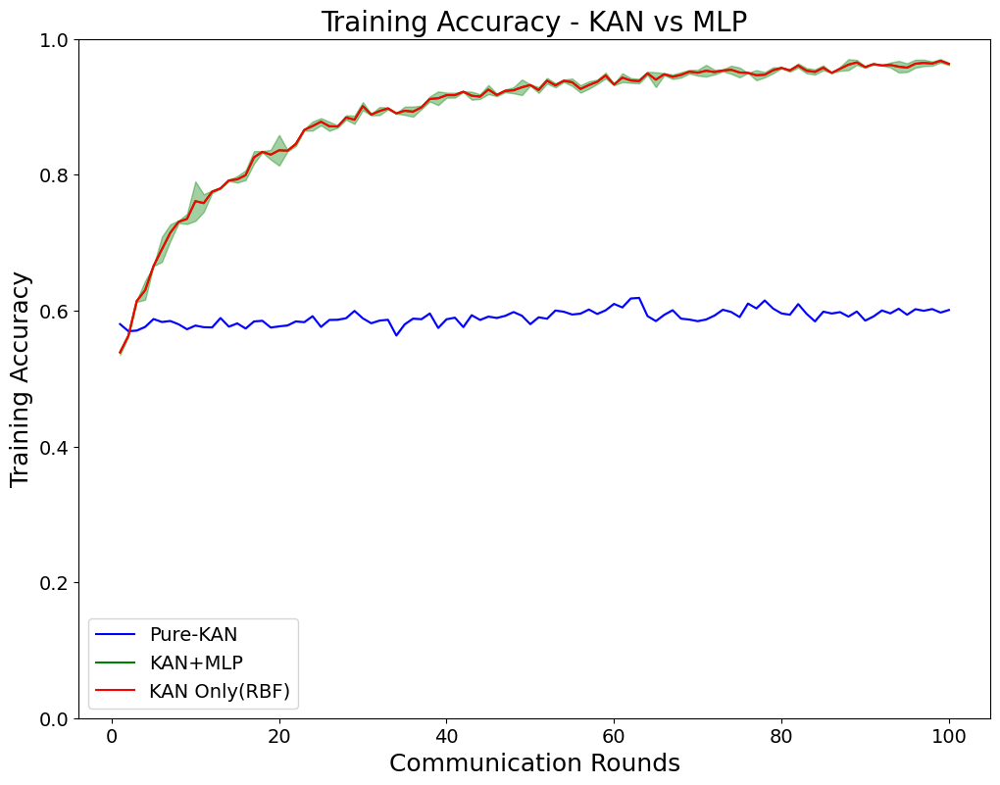

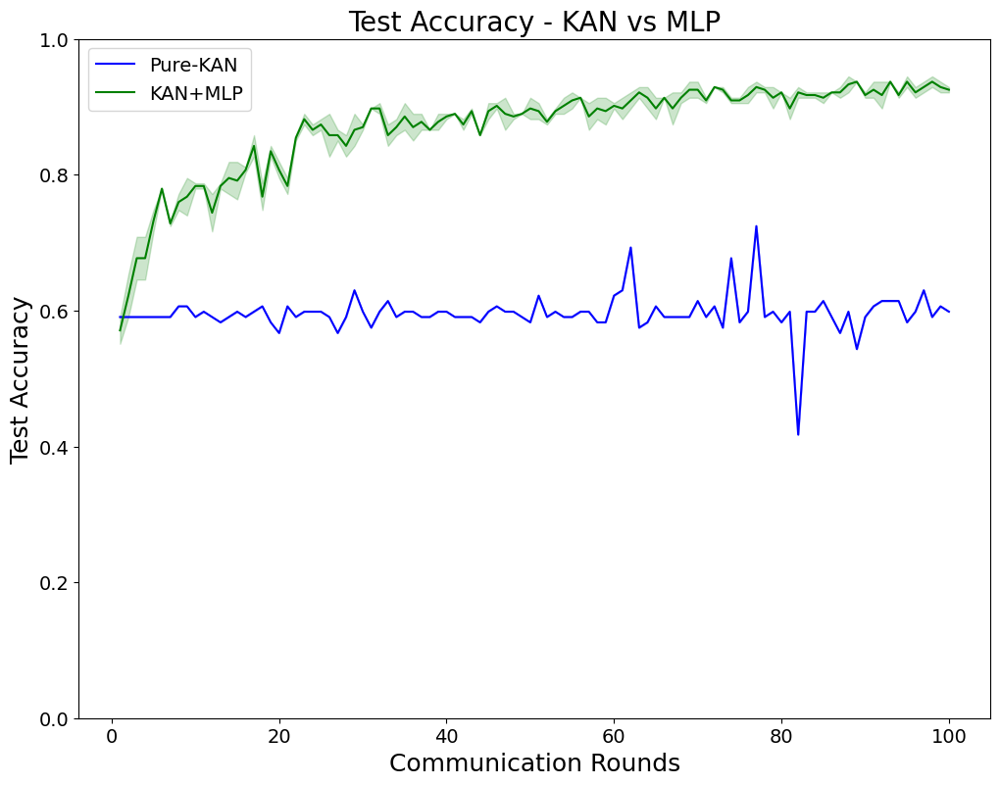

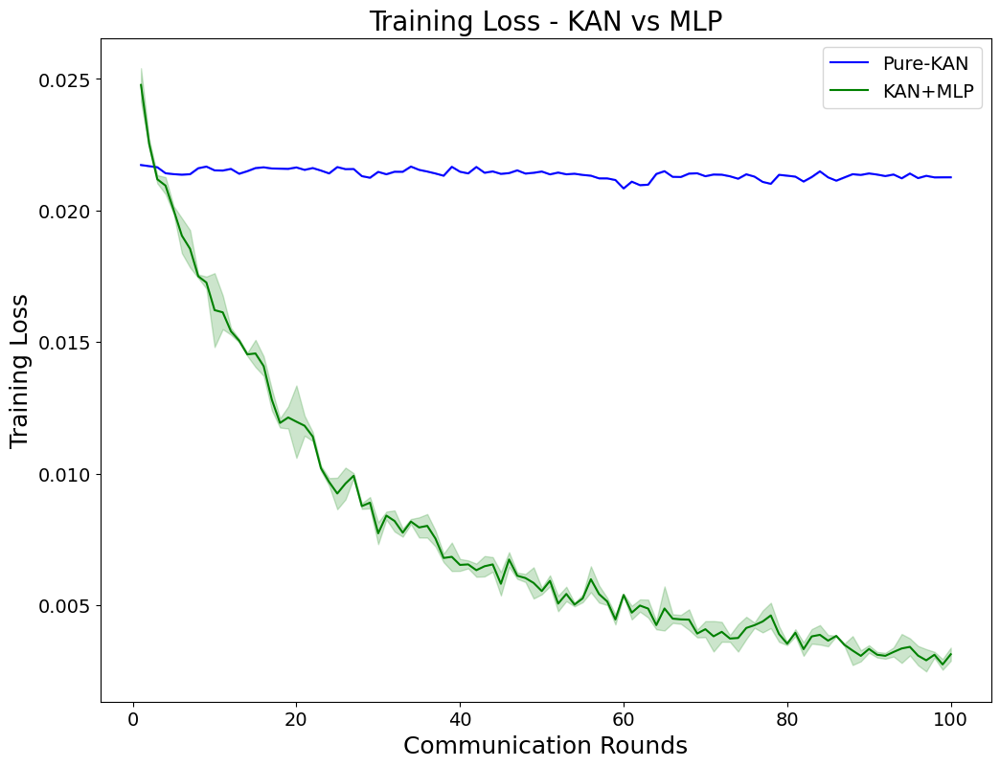

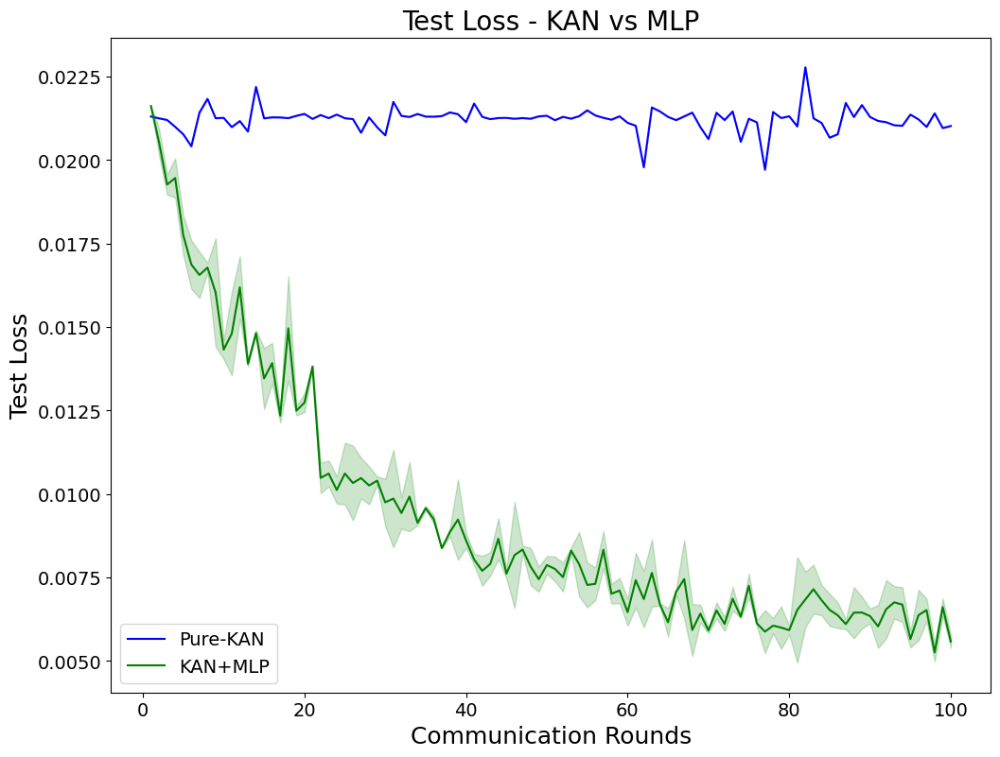

In [ ]:
figsize=(12, 9)

# Plot Training Accuracy with error bands for 'kan' and 'mlp'
plt.figure(figsize=figsize)

plt.plot(comm_rounds, kan_results[0], 'b-', label='Pure-KAN')
plt.fill_between(comm_rounds, kan_results[0] - kan_results[1], kan_results[0] + kan_results[1], color='b', alpha=0.2)

# plt.plot(comm_rounds, mlp_results[0], 'r-', label='MLP')
# plt.fill_between(comm_rounds, mlp_results[0] - mlp_results[1], mlp_results[0] + mlp_results[1], color='r', alpha=0.2)

plt.plot(comm_rounds, fastkan_results[0], 'g-', label='KAN+MLP')
plt.fill_between(comm_rounds, fastkan_results[0] - fastkan_results[1], fastkan_results[0] + fastkan_results[1], color='g', alpha=0.2)

plt.plot(comm_rounds, fastkan_results[0], 'r-', label='KAN Only(RBF)')
plt.fill_between(comm_rounds, fastkan_results[0] - fastkan_results[1], fastkan_results[0] + fastkan_results[1], color='g', alpha=0.2)

plt.title(f"Training Accuracy - KAN vs MLP")
plt.xlabel("Communication Rounds")
plt.ylabel("Training Accuracy")
plt.ylim(0, 1)
# plt.xticks(comm_rounds)
plt.legend()
plt.show()

# Plot Test Accuracy with error bands for 'kan' and 'mlp'
plt.figure(figsize=figsize)

plt.plot(comm_rounds, kan_results[2], 'b-', label='Pure-KAN')
plt.fill_between(comm_rounds, kan_results[2] - kan_results[3], kan_results[2] + kan_results[3], color='b', alpha=0.2)

# plt.plot(comm_rounds, mlp_results[2], 'r-', label='MLP')
# plt.fill_between(comm_rounds, mlp_results[2] - mlp_results[3], mlp_results[2] + mlp_results[3], color='r', alpha=0.2)

plt.plot(comm_rounds, fastkan_results[2], 'g-', label='KAN+MLP')
plt.fill_between(comm_rounds, fastkan_results[2] - fastkan_results[3], fastkan_results[2] + fastkan_results[3], color='g', alpha=0.2)



plt.title(f"Test Accuracy - KAN vs MLP")
plt.xlabel("Communication Rounds")
plt.ylabel("Test Accuracy")
plt.ylim(0, 1)
# plt.xticks(comm_rounds)
plt.legend()
plt.show()

# Plot Training Loss with error bands for 'kan' and 'mlp'
plt.figure(figsize=figsize)

plt.plot(comm_rounds, kan_results[4], 'b-', label='Pure-KAN')
plt.fill_between(comm_rounds, kan_results[4] - kan_results[5], kan_results[4] + kan_results[5], color='b', alpha=0.2)

# plt.plot(comm_rounds, mlp_results[4], 'r-', label='MLP')
# plt.fill_between(comm_rounds, mlp_results[4] - mlp_results[5], mlp_results[4] + mlp_results[5], color='r', alpha=0.2)

plt.plot(comm_rounds, fastkan_results[4], 'g-', label='KAN+MLP')
plt.fill_between(comm_rounds, fastkan_results[4] - fastkan_results[5], fastkan_results[4] + fastkan_results[5], color='g', alpha=0.2)

plt.title(f"Training Loss - KAN vs MLP")
plt.xlabel("Communication Rounds")
plt.ylabel("Training Loss")
# plt.xticks(comm_rounds)
plt.legend()
plt.show()

# Plot Test Loss with error bands for 'kan' and 'mlp'
plt.figure(figsize=figsize)

plt.plot(comm_rounds, kan_results[6], 'b-', label='Pure-KAN')
plt.fill_between(comm_rounds, kan_results[6] - kan_results[7], kan_results[6] + kan_results[7], color='b', alpha=0.2)

# plt.plot(comm_rounds, mlp_results[6], 'r-', label='MLP')
# plt.fill_between(comm_rounds, mlp_results[6] - mlp_results[7], mlp_results[6] + mlp_results[7], color='r', alpha=0.2)

plt.plot(comm_rounds, fastkan_results[6], 'g-', label='KAN+MLP')
plt.fill_between(comm_rounds, fastkan_results[6] - fastkan_results[7], fastkan_results[6] + fastkan_results[7], color='g', alpha=0.2)

plt.title(f"Test Loss - KAN vs MLP")
plt.xlabel("Communication Rounds")
plt.ylabel("Test Loss")
# plt.xticks(comm_rounds)
plt.legend()
plt.show()

#Communication Cost per Round (MLP vs KAN)


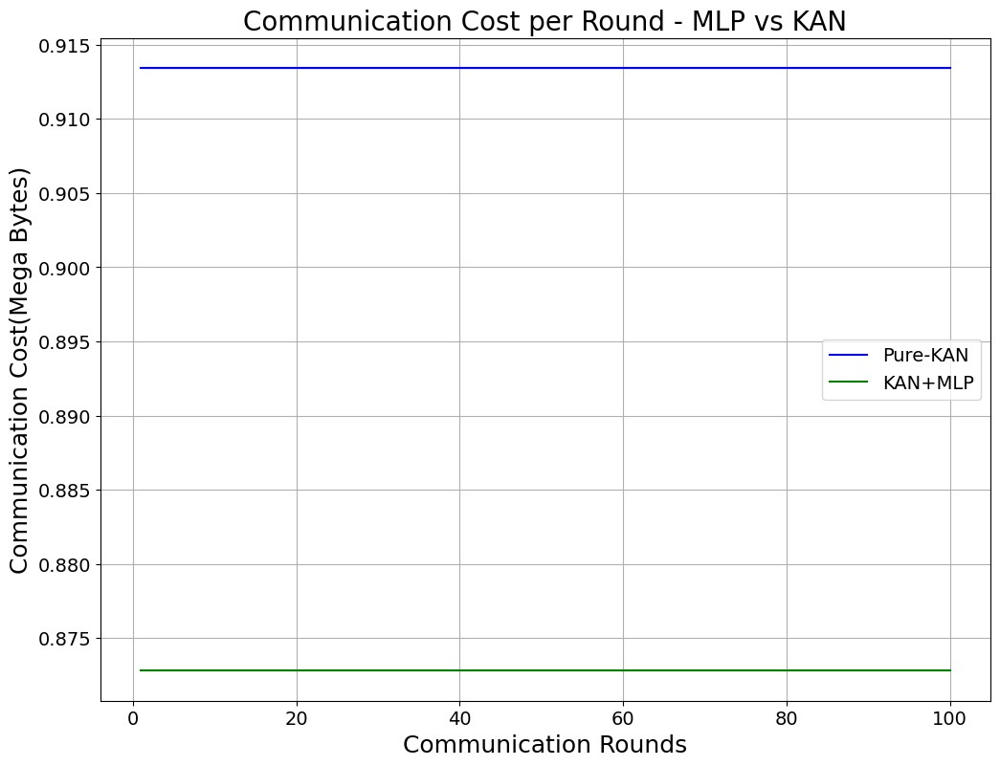

In [ ]:
plt.figure(figsize=figsize)

# Plot for Spline-KAN
plt.plot(comm_rounds, kan_results[10], 'b-', label='Pure-KAN')
plt.fill_between(comm_rounds, kan_results[10] - kan_results[11], kan_results[10] + kan_results[11], color='b', alpha=0.2)

# Plot for Spline-KAN
plt.plot(comm_rounds, fastkan_results[10], 'g-', label='KAN+MLP')
plt.fill_between(comm_rounds, fastkan_results[10] - fastkan_results[11], fastkan_results[10] + fastkan_results[11], color='g', alpha=0.2)

# Plot for MLP
# plt.plot(comm_rounds, mlp_results[10], 'r-', label='MLP')
# plt.fill_between(comm_rounds, mlp_results[10] - mlp_results[11], mlp_results[10] + mlp_results[11], color='r', alpha=0.2)

plt.title("Communication Cost per Round - MLP vs KAN")
plt.xlabel("Communication Rounds")
plt.ylabel("Communication Cost(Mega Bytes)")
plt.legend()
plt.grid(True)
plt.show()

#KAN: Accuracy vs Communication Rounds


In [ ]:
plt.figure(figsize=figsize)
plt.plot(comm_rounds, kan_results[0], 'b-', label='Train Accuracy')
plt.fill_between(comm_rounds, kan_results[0] - kan_results[1], kan_results[0] + kan_results[1], color='b', alpha=0.2)

plt.plot(comm_rounds, kan_results[2], 'c-', label='Test Accuracy')
plt.fill_between(comm_rounds, kan_results[2] - kan_results[3], kan_results[2] + kan_results[3], color='c', alpha=0.2)

plt.title("Spline-KAN: Accuracy vs Communication Rounds")
plt.xlabel("Communication Rounds")
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.legend()
plt.show()

#MLP: Accuracy vs Communication Rounds


In [ ]:
plt.figure(figsize=figsize)
plt.plot(comm_rounds, mlp_results[0], 'r-', label='Train Accuracy')
plt.fill_between(comm_rounds, mlp_results[0] - mlp_results[1], mlp_results[0] + mlp_results[1], color='r', alpha=0.2)

plt.plot(comm_rounds, mlp_results[2], 'm-', label='Test Accuracy')
plt.fill_between(comm_rounds, mlp_results[2] - mlp_results[3], mlp_results[2] + mlp_results[3], color='m', alpha=0.2)

plt.title("MLP: Accuracy vs Communication Rounds")
plt.xlabel("Communication Rounds")
plt.ylabel("Accuracy")
plt.ylim(0, 1)
plt.legend()
plt.show()

#KAN: Loss vs Communication Rounds


In [ ]:
plt.figure(figsize=figsize)
plt.plot(comm_rounds, kan_results[4], 'b-', label='Train Loss')
plt.fill_between(comm_rounds, kan_results[4] - kan_results[5], kan_results[4] + kan_results[5], color='b', alpha=0.2)

plt.plot(comm_rounds, kan_results[6], 'c-', label='Test Loss')
plt.fill_between(comm_rounds, kan_results[6] - kan_results[7], kan_results[6] + kan_results[7], color='c', alpha=0.2)

plt.title("Spline-KAN: Loss vs Communication Rounds")
plt.xlabel("Communication Rounds")
plt.ylabel("Loss")
plt.legend()
plt.show()

#MLP: Loss vs Communication Rounds


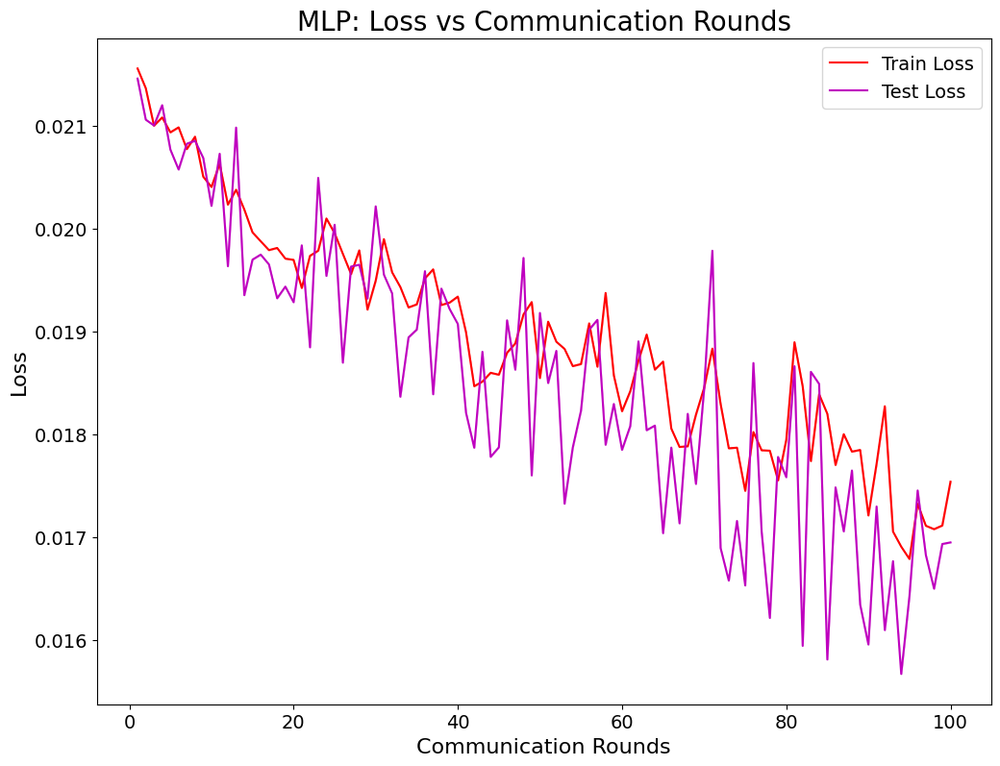

In [ ]:
plt.figure(figsize=figsize)
plt.plot(comm_rounds, mlp_results[4], 'r-', label='Train Loss')
plt.fill_between(comm_rounds, mlp_results[4] - mlp_results[5], mlp_results[4] + mlp_results[5], color='r', alpha=0.2)

plt.plot(comm_rounds, mlp_results[6], 'm-', label='Test Loss')
plt.fill_between(comm_rounds, mlp_results[6] - mlp_results[7], mlp_results[6] + mlp_results[7], color='m', alpha=0.2)

plt.title("MLP: Loss vs Communication Rounds")
plt.xlabel("Communication Rounds")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [ ]:
print(f"Execution time for KAN: {kan_results[8]} ± {kan_results[9]} seconds")
print(f"Execution time for MLP: {mlp_results[8]} ± {mlp_results[9]} seconds")
print(f"Execution time for FastKAN: {fastkan_results[8]} ± {fastkan_results[9]} seconds")


## Hypothesis Testing


### Convert to Pandas Dataframe and Process Data


In [ ]:
import pandas as pd
df_kan = pd.DataFrame(kan_data)
df_mlp = pd.DataFrame(mlp_data)
df_fastkan = pd.DataFrame(fastkan_data)

In [ ]:
# Function to process the dataframe as described by the user
def process_dataframe(df):
    # Step 1: Remove the columns 'train_accuracy', 'test_loss', 'train_loss'
    df = df.drop(columns=['train_accuracy', 'test_loss', 'train_loss'])

    # Step 2: Modify the 'test_accuracy' column
    # Removing the first pair (round 0) and keeping only the accuracy value from remaining pairs
    df['test_accuracy'] = df['test_accuracy'].apply(lambda x: [pair[0] for pair in x[1:]])

    # Step 3: Create new columns r10, r20, r30, ..., r100
    for i in range(1, 11):
        df[f'r{i*10}'] = df['test_accuracy'].apply(lambda x: x[i*10-1])

    return df

processed_kan_data = process_dataframe(df_kan)
processed_mlp_data = process_dataframe(df_mlp)
processed_fastkan_data = process_dataframe(df_fastkan)

In [ ]:
processed_kan_data.head(3)

### Get Accuracy Means for Selected Rounds


In [ ]:
rounds = [f'r{i*10}' for i in range(1, 11)]

#### Spline-KAN Accuracy Means


In [ ]:
processed_kan_data[rounds].describe().round(3).T

#### RBF-KAN Accuracy Means


In [ ]:
processed_fastkan_data[rounds].describe().round(3).T

#### MLP Accuracy Means


In [ ]:
processed_mlp_data[rounds].describe().round(3).T

Difference between Accuracy Means for Spline-KAN vs MLP


In [ ]:
(processed_kan_data[rounds].mean() - processed_mlp_data[rounds].mean()).round(3)

### Apply tests for accuracy


In [ ]:
from scipy.stats import ttest_ind

# Function to apply Welch's t-test
def welchs_ttest(kan_data, mlp_data, round_column):
    # Perform one-sided Welch's t-test (greater test)
    t_stat, p_value = ttest_ind(kan_data[round_column],
                                mlp_data[round_column],
                                equal_var=False,
                                alternative='greater'
                                )

    return t_stat, p_value

# List of rounds (columns)
rounds = [f'r{i*10}' for i in range(1, 11)]

# Dictionary to store t-statistics and p-values for each round
kan_mlp_results = {}
fastkan_mlp_results = {}

# Apply Welch's t-test for both comparisons
for round_col in rounds:
    kan_mlp_t_stat, kan_mlp_p_value = welchs_ttest(processed_kan_data, processed_mlp_data, round_col)
    kan_mlp_results[round_col] = {'t_stat': kan_mlp_t_stat, 'p_value': kan_mlp_p_value}
    fastkan_mlp_t_stat, fastkan_mlp_p_value = welchs_ttest(processed_fastkan_data, processed_mlp_data, round_col)
    fastkan_mlp_results[round_col] = {'t_stat': fastkan_mlp_t_stat, 'p_value': fastkan_mlp_p_value}

# Displaying the results
kan_mlp_results_df = pd.DataFrame(kan_mlp_results).T
fastkan_mlp_results_df = pd.DataFrame(fastkan_mlp_results).T

# Suppress scientific notation and set precision to 10 decimal places
#pd.set_option('display.float_format', lambda x: f'{x:.10f}')
#pd.reset_option('display.float_format')

print("KAN vs MLP:")
display(kan_mlp_results_df.round(4))
print("\nFastKAN vs MLP:")
display(fastkan_mlp_results_df.round(4))

## Find ratio between execution times


In [ ]:
from scipy import stats

def times_ratio(sample_A, sample_B):
        mean_A = np.mean(sample_A)
        mean_B = np.mean(sample_B)
        return mean_A / mean_B

def calculate_confidence_interval(df_kan, df_mlp, confidence_level=0.95, n_resamples=10000):

    # Perform bootstrap
    res = stats.bootstrap(
        data=(df_kan['execution_time'], df_mlp['execution_time']),
        statistic=times_ratio,
        confidence_level=confidence_level,
        n_resamples=n_resamples,
        method='percentile',
        vectorized=False,
        paired=False,
        random_state=42
    )

    lower_bound = res.confidence_interval.low
    upper_bound = res.confidence_interval.high

    return lower_bound, upper_bound

### Spline-KAN vs MLP


In [ ]:
lower_bound, upper_bound = calculate_confidence_interval(df_kan, df_mlp, confidence_level=0.95)

print(f"{int(confidence_level*100)}% Confidence Interval for beta: ({lower_bound:.2f}, {upper_bound:.2f})")

### RBF-KAN vs MLP


In [ ]:
lower_bound, upper_bound = calculate_confidence_interval(df_fastkan, df_mlp, confidence_level=0.95)

print(f"{int(confidence_level*100)}% Confidence Interval for beta: ({lower_bound:.2f}, {upper_bound:.2f})")

# Estimate Parameters from Zeydan et al. [2024] - [ArXiv](https://arxiv.org/pdf/2407.20100)


We are adapting the authors code from GitHub (https://github.com/ezeydan/F-KANs/blob/main/main.py)


In [ ]:
!pip install pykan

In [ ]:
import torch
import torch.nn as nn
import numpy as np
from torch.utils.data import DataLoader, TensorDataset, random_split
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_recall_fscore_support
from kan import KAN as PyKAN
import matplotlib.pyplot as plt
import copy
import time


# Split train_dataset for federated learning into 2 clients
num_clients = 2
rounds = 20

# Define the KANClassifier with Dropout layers
class KANClassifier(nn.Module):
    def __init__(self, kan_model, num_classes):
        super(KANClassifier, self).__init__()
        self.kan_model = kan_model
        last_layer_width = kan_model.width[-1]
        if isinstance(last_layer_width, list):
            if len(last_layer_width) == 2:
                last_layer_width = last_layer_width[0]
            else:
                raise ValueError("Unexpected format for kan_model.width[-1]")
        self.fc = nn.Linear(last_layer_width, num_classes)
        self.dropout = nn.Dropout(p=0.5)  # Dropout with 50% probability
        self._initialize_weights()

    def _initialize_weights(self):
        nn.init.kaiming_normal_(self.fc.weight)
        if self.fc.bias is not None:
            nn.init.constant_(self.fc.bias, 0)

    def forward(self, x):
        x = self.kan_model(x)
        x = self.dropout(x)
        x = self.fc(x)
        return x

    def train_kan(self, dataset, steps, lamb, lamb_entropy):
        optimizer = torch.optim.Adam(self.parameters(), lr=0.001, weight_decay=1e-5)  # Added weight decay
        loss_fn = nn.CrossEntropyLoss()
        for step in range(steps):
            optimizer.zero_grad()
            outputs = self(dataset['train_input'].float())
            loss = loss_fn(outputs, dataset['train_label'])
            loss.backward()
            torch.nn.utils.clip_grad_norm_(self.parameters(), max_norm=1.0)
            optimizer.step()

# Define the MLP model with the same depth as KAN
class MLP(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size):
        super(MLP, self).__init__()
        layers = []
        sizes = [input_size] + hidden_sizes + [output_size]
        for i in range(len(sizes) - 1):
            layers.append(nn.Linear(sizes[i], sizes[i + 1]))
            if i < len(sizes) - 2:
                layers.append(nn.ReLU())
                layers.append(nn.Dropout(p=0.5))  # Dropout with 50% probability
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

    def train_model(self, dataset, steps, learning_rate=0.001):
        optimizer = torch.optim.Adam(self.parameters(), lr=learning_rate, weight_decay=1e-5)  # Added weight decay
        loss_fn = nn.CrossEntropyLoss()
        for step in range(steps):
            optimizer.zero_grad()
            outputs = self(dataset['train_input'].float())
            loss = loss_fn(outputs, dataset['train_label'])
            loss.backward()
            torch.nn.utils.clip_grad_norm_(self.parameters(), max_norm=1.0)
            optimizer.step()

def create_dataset(loader):
    inputs = []
    labels = []
    for data in loader:
        inputs.append(data[0])
        labels.append(data[1])
    inputs = torch.cat(inputs, dim=0)
    labels = torch.cat(labels, dim=0)
    return {
        'train_input': inputs,
        'train_label': labels,
        'test_input': inputs.clone(),
        'test_label': labels.clone()
    }

def fed_avg(global_model, client_models):
    global_state_dict = global_model.state_dict()
    for param_tensor in global_state_dict:
        global_state_dict[param_tensor].zero_()
    for client_model in client_models:
        client_state_dict = client_model.state_dict()
        for param_tensor in global_state_dict:
            global_state_dict[param_tensor] += client_state_dict[param_tensor] / len(client_models)
    global_model.load_state_dict(global_state_dict)
    return global_model

def compute_metrics(model, loader):
    loss_fn = torch.nn.CrossEntropyLoss()
    total_loss = 0
    correct = 0
    total = 0
    all_labels = []
    all_preds = []
    model.training = False
    with torch.no_grad():
        for inputs, labels in loader:
            outputs = model(inputs.float())
            loss = loss_fn(outputs, labels)
            total_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())
    avg_loss = total_loss / len(loader.dataset)
    accuracy = correct / total
    precision, recall, f1, _ = precision_recall_fscore_support(all_labels, all_preds, average='weighted')
    model.training = True
    return avg_loss, accuracy, precision, recall, f1

def federated_learning_rounds(global_model, client_loaders, test_loader, rounds=rounds, steps=20):
    train_losses = []
    test_losses = []
    train_accuracies = []
    test_accuracies = []
    train_precisions = []
    test_precisions = []
    train_recalls = []
    test_recalls = []
    train_f1s = []
    test_f1s = []

    for round_num in range(rounds):
        client_models = [copy.deepcopy(global_model) for _ in range(len(client_loaders))]
        for i, client_loader in enumerate(client_loaders):
            client_dataset = create_dataset(client_loader)
            print(f"Training client {i+1}/{len(client_loaders)}")
            if isinstance(client_models[i], KANClassifier):
                client_models[i].train_kan(client_dataset, steps, lamb=0.01, lamb_entropy=10.0)
            elif isinstance(client_models[i], MLP):
                client_models[i].train_model(client_dataset, steps)

        global_model = fed_avg(global_model, client_models)

        train_loss, train_accuracy, train_precision, train_recall, train_f1 = compute_metrics(global_model, client_loaders[0])
        test_loss, test_accuracy, test_precision, test_recall, test_f1 = compute_metrics(global_model, test_loader)

        train_losses.append(train_loss)
        test_losses.append(test_loss)
        train_accuracies.append(train_accuracy)
        test_accuracies.append(test_accuracy)
        train_precisions.append(train_precision)
        test_precisions.append(test_precision)
        train_recalls.append(train_recall)
        test_recalls.append(test_recall)
        train_f1s.append(train_f1)
        test_f1s.append(test_f1)

        print(f'Round {round_num+1} - Train Loss: {train_loss:.4f}, Test Loss: {test_loss:.4f}, '
              f'Train Accuracy: {train_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}, '
              f'Train Precision: {train_precision:.4f}, Test Precision: {test_precision:.4f}, '
              f'Train Recall: {train_recall:.4f}, Test Recall: {test_recall:.4f}, '
              f'Train F1: {train_f1:.4f}, Test F1: {test_f1:.4f}')

    return global_model, train_losses, test_losses, train_accuracies, test_accuracies, train_precisions, test_precisions, train_recalls, test_recalls, train_f1s, test_f1s

# Initialize KAN model with 3 hidden layers and dropout
kan_width = [4, 20, 20, 20]
base_kan_model = PyKAN(width=kan_width, grid=5, k=3, seed=0)
last_layer_width = base_kan_model.width[-1]
if isinstance(last_layer_width, list):
    if len(last_layer_width) == 2:
        last_layer_width = last_layer_width[0]
    else:
        raise ValueError("Unexpected format for kan_model.width[-1]")
kan_global_model = KANClassifier(base_kan_model, num_classes=3)

# Initialize MLP model with 3 hidden layers and the same number of units as KAN
input_size = 4
hidden_sizes = [20, 20, 20]
output_size = 3
mlp_model = MLP(input_size, hidden_sizes, output_size)

## PyKAN Parameters


In [ ]:
kan_params = sum(p.numel() for p in kan_global_model.parameters() if p.requires_grad)
print(f"Total KAN Parameters: {kan_params}")

In [ ]:
mlp_params = sum(p.numel() for p in mlp_model.parameters() if p.requires_grad)
print(f"Total MLP Parameters: {mlp_params}")